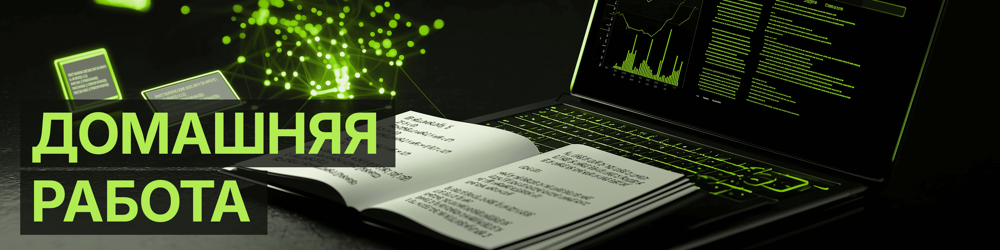

**Навигация по уроку**
1. [Задача обнаружения объектов](https://colab.research.google.com/drive/1oOrMEXL1LeMmbnu0wxnSjXMOeQaUthI4)
2. [Обнаружение объектов. Архитектура YOLOv3](https://colab.research.google.com/drive/112try2PtPk-jYcyeo61y5hsdmY9brrzD)
3. [Детекция в реальном времени. YOLOv11](https://colab.research.google.com/drive/1R1o-wD4jRT0DXhKbeWL0yVzV4JFhXTHq)
4. Домашняя работа

В домашней работе вам необходимо выполнить одно из трёх заданий на выбор:

**Задание 1. На 3 балла:**

1. Используя датасет [Traffic Signs Detection](https://storage.yandexcloud.net/academy.ai/CV/traffic_signs_detection.zip), дообучите модель YOLO v11 распознавать дорожные знаки в дорожном траффике.
2. Используйте видео, которое находится также внутри датасета для проверки модели.

**Задание 2. На 4 балла:**

1. Используйте модель YOLOv3 из урока, а также вспомогательные функции урока, обучите модель детектировать шахматные фигуры. Модель создайте с нуля.
  

**Задание 3. На 5 балла:**

1. Используйте модель YOLOv3 из урока, а также вспомогательные функции урока, обучите модель детектировать шахматные фигуры.  Модель создайте с нуля.
2. Обеспечьте, чтобы изображения на выходе сети восстанавливались до своего первоначального размера, при этом необходимо, чтобы размер предсказанных ограничивающих рамок, так же правильно трансформировался под размер изображения.
3. Продемонстрируйте работу сети на изображениях разного размера, как альбомной, так и портретной ориентации.

In [1]:
# Обработка изображений
import cv2
from google.colab.patches import cv2_imshow
from PIL import Image

# Линейная алгебра
import numpy as np

# Графики
from matplotlib import pyplot as plt

# работа с фйалами и ОС
import os
import requests
from zipfile import ZipFile
from io import BytesIO

# Работаем с фреймворком Keras и Tensorflow
import tensorflow as tf
from tensorflow.keras import Model
from tensorflow.keras.layers import Add, Concatenate, Lambda
from tensorflow.keras.layers import Conv2D, Input, LeakyReLU
from tensorflow.keras.layers import MaxPool2D, UpSampling2D, ZeroPadding2D, BatchNormalization
from tensorflow.keras.regularizers import l2
from tensorflow.keras.losses import binary_crossentropy
from tensorflow.keras.losses import sparse_categorical_crossentropy

from itertools import repeat

Определим константы для модели:

In [ ]:
YOLO_IOU_THRESHOLD = 0.6 # порог для оценок перекрытия IOU в NMS (параметр iou_threshold в tf.image.combined_non_max_suppression)
YOLO_SCORE_THRESHOLD = 0.4 # порог для оценок scores применяется в NMS (параметр score_threshold в tf.image.combined_non_max_suppression)

WEIGHT_YOLO_V3 = 'yolov3.weights' # путь к файлу с предобученными весами
SIZE = 416 # изменяем изображения до размеров
CHECKPOINTS = 'yolov3.weights.h5' # путь сохранения весов модели
NUM_CLASSES = 12 # число классов, на которых будет обучена модель - 12 шахматных фигур

# Загружаем и обрабатываем датасет

In [ ]:
# Download dataset
response = requests.get("https://public.roboflow.com/ds/nz8qgLBcbv?key=grwfQuh8d7")
zip_file = ZipFile(BytesIO(response.content))
zip_file.extractall("chess_dataset")

In [ ]:
with open('./chess_dataset/train/_darknet.labels', "r") as f:
    darknet_labels = [line.strip() for line in f]

print(*darknet_labels, sep='\n')

bishop
black-bishop
black-king
black-knight
black-pawn
black-queen
black-rook
white-bishop
white-king
white-knight
white-pawn
white-queen
white-rook


In [ ]:
CLASS_NAMES = [
    'black-bishop',
    'black-king',
    'black-knight',
    'black-pawn',
    'black-queen',
    'black-rook',
    'white-bishop',
    'white-king',
    'white-knight',
    'white-pawn',
    'white-queen',
    'white-rook',
]

Наши лейблы и лейблы в датасете отличаются - добавлен еще один в нулевом элементе - bishop, подготовим датасет с учетом этого

In [ ]:
def load_dataset(split="train"):
    images = []
    bboxes_list = []  # bounding boxes как float
    classes_list = [] # классы как int
    base_path = f"chess_dataset/{split}"
    for img_file in os.listdir(base_path):
        if img_file.endswith(".jpg"):
            img_path = os.path.join(base_path, img_file)
            label_path = os.path.join(base_path, img_file.replace(".jpg", ".txt"))
            if os.path.exists(label_path):
                with open(label_path, "r") as f:
                    label_lines = f.readlines()
                bboxes = []
                classes = []
                for line in label_lines:
                    cls, x, y, w, h = map(float, line.strip().split())
                    cls_int = int(cls) - 1  # игнорируем класс bishop
                    bboxes.append([x - w/2, y - h/2, x + w/2, y + h/2])
                    classes.append(cls_int)
                bboxes_list.append(np.array(bboxes, dtype=np.float32))
                classes_list.append(np.array(classes, dtype=int))
                img = cv2.imread(img_path)
                images.append(img)
    return images, bboxes_list, classes_list

train_images, train_bboxes, train_labels = load_dataset("train")
valid_images, valid_bboxes, valid_labels = load_dataset("valid")

In [ ]:
# проверим, что нет отрицательных классов после смещения
def check_minus_one_in_labels(labels_list, dataset_name="train"):
    minus_one_found = False
    problematic_images = []

    for i, labels in enumerate(labels_list):
        if -1 in labels:
            minus_one_found = True
            problematic_images.append((i, np.where(labels == -1)[0]))
            print(f"Найдено -1 в {dataset_name} изображении {i}: позиции {np.where(labels == -1)[0]}")

    if not minus_one_found:
        print(f"В {dataset_name} датасете нет значений -1")
    else:
        print(f"Всего изображений с -1 в {dataset_name}: {len(problematic_images)}")

    return problematic_images

# Проверяем тренировочные данные
train_problems = check_minus_one_in_labels(train_labels, "train")

# Проверяем валидационные данные
valid_problems = check_minus_one_in_labels(valid_labels, "valid")

Найдено -1 в train изображении 114: позиции [3]
Всего изображений с -1 в train: 1
В valid датасете нет значений -1


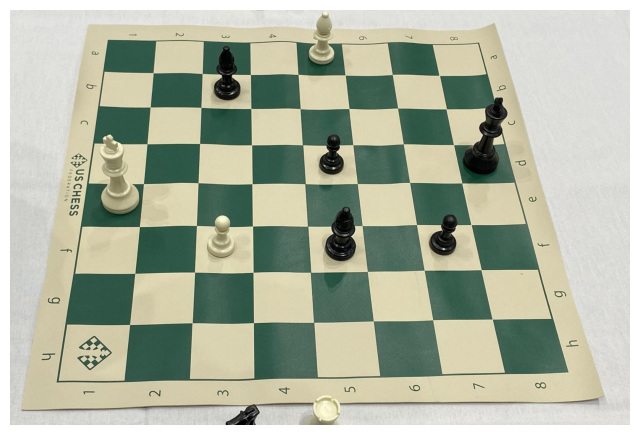

In [ ]:
# Отображаем изображение
plt.figure(figsize=(8, 6))
plt.imshow(cv2.cvtColor(train_images[80], cv2.COLOR_BGR2RGB))
plt.axis('off')  # Скрываем оси
plt.show()

In [ ]:
index=train_labels[80]
print(index)

[ 7  1  6 -1  9  3  3  0]


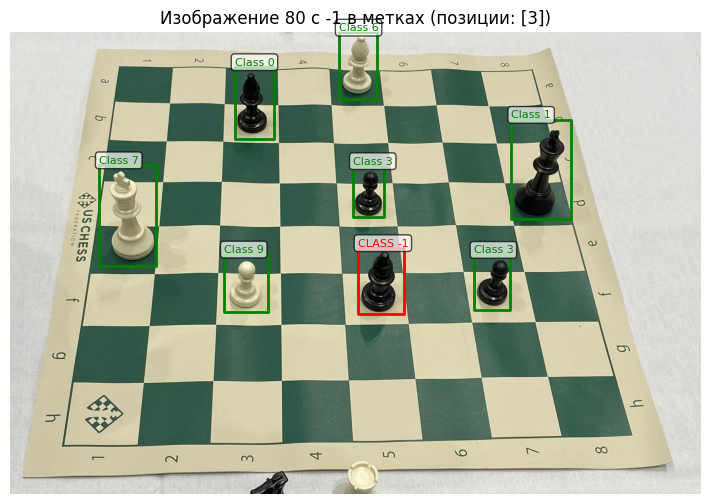

In [ ]:
import matplotlib.pyplot as plt

def visualize_problematic_images(images, bboxes, labels, problematic_indices, max_to_show=3):
    """Визуализирует изображения с проблемными метками"""
    for i, (img_idx, label_indices) in enumerate(problematic_indices[:max_to_show]):
        img = images[img_idx]
        bbox = bboxes[img_idx]
        lbl = labels[img_idx]

        plt.figure(figsize=(10, 6))
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(f"Изображение {img_idx} с -1 в метках (позиции: {label_indices})")

        # Рисуем bounding boxes
        for j, (box, label) in enumerate(zip(bbox, lbl)):
            if label == -1:
                color = 'red'
                label_text = "CLASS -1"
            else:
                color = 'green'
                label_text = f"Class {label}"

            x1, y1, x2, y2 = box
            plt.plot([x1*img.shape[1], x2*img.shape[1], x2*img.shape[1], x1*img.shape[1], x1*img.shape[1]],
                    [y1*img.shape[0], y1*img.shape[0], y2*img.shape[0], y2*img.shape[0], y1*img.shape[0]],
                    color=color, linewidth=2)
            plt.text(x1*img.shape[1], y1*img.shape[0]-5, label_text, color=color, fontsize=8,
                    bbox=dict(boxstyle="round,pad=0.3", facecolor='white', alpha=0.7))

        plt.axis('off')
        plt.show()

# Если нашли проблемные изображения, визуализируем их
if train_problems:
    visualize_problematic_images(train_images, train_bboxes, train_labels, train_problems)

In [ ]:
def fix_labels(labels_list):
    """Заменяет -1 на корректные значения"""
    fixed_labels = []
    for labels in labels_list:
        # Заменяем -1 на 0 - верный класс
        fixed = np.where(labels == -1, 0, labels)
        fixed_labels.append(fixed)
    return fixed_labels

# Применяем исправление
if any(-1 in labels for labels in train_labels):
    print("Исправляем метки...")
    train_labels = fix_labels(train_labels)
    valid_labels = fix_labels(valid_labels)

Исправляем метки...


In [ ]:
history = yolo.fit(train_dataset, epochs=50, validation_data=valid_dataset)

In [ ]:
train_problems = check_minus_one_in_labels(train_labels, "train")

В train датасете нет значений -1


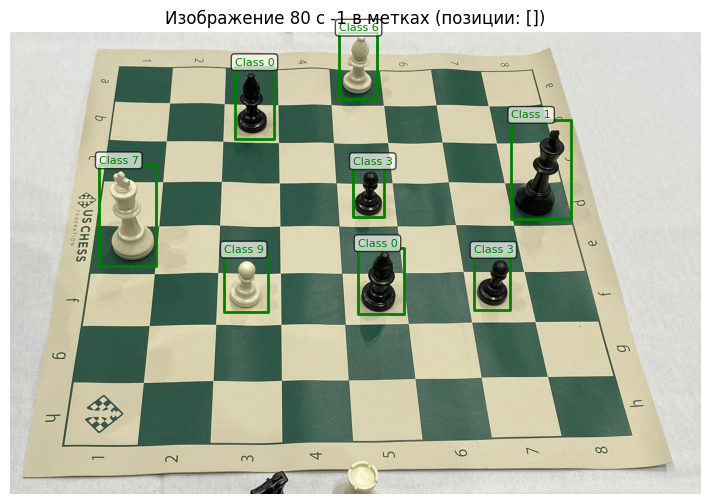

In [ ]:
fixed_image_idx = 80

# Создаем фиктивный список проблемных индексов (хотя теперь проблем нет)
fixed_problematic_indices = [(fixed_image_idx, [])]  # пустой список позиций, так как проблем нет

# Используем ту же функцию для визуализации
visualize_problematic_images(train_images, train_bboxes, train_labels, fixed_problematic_indices, max_to_show=1)

In [ ]:
def visualize_image_with_boxes(images, bboxes, labels, image_indices, class_names=None, max_to_show=3):
    """Визуализирует изображения с bounding boxes"""
    if class_names is None:
        class_names = [f"Class {i}" for i in range(12)]  # Замените 12 на ваше количество классов

    for i, img_idx in enumerate(image_indices[:max_to_show]):
        img = images[img_idx]
        bbox = bboxes[img_idx]
        lbl = labels[img_idx]

        plt.figure(figsize=(12, 8))
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(f"Изображение {img_idx}")

        # Рисуем bounding boxes
        for j, (box, label) in enumerate(zip(bbox, lbl)):
            # Пропускаем пустые боксы (все координаты равны 0)
            if np.all(box == 0):
                continue

            # Определяем цвет в зависимости от класса
            colors = ['red', 'green', 'blue', 'yellow', 'purple', 'orange',
                     'pink', 'brown', 'gray', 'olive', 'cyan', 'magenta']
            color = colors[label % len(colors)]

            # Получаем имя класса
            if 0 <= label < len(class_names):
                label_text = f"{class_names[label]}"
            else:
                label_text = f"Unknown {label}"

            x1, y1, x2, y2 = box
            # Преобразуем нормализованные координаты в пиксельные
            x1_px, x2_px = x1 * img.shape[1], x2 * img.shape[1]
            y1_px, y2_px = y1 * img.shape[0], y2 * img.shape[0]

            # Рисуем прямоугольник
            plt.plot([x1_px, x2_px, x2_px, x1_px, x1_px],
                    [y1_px, y1_px, y2_px, y2_px, y1_px],
                    color=color, linewidth=2)

            # Добавляем подпись
            plt.text(x1_px, y1_px-5, label_text, color=color, fontsize=10,
                    bbox=dict(boxstyle="round,pad=0.3", facecolor='white', alpha=0.8))

        plt.axis('off')
        plt.show()

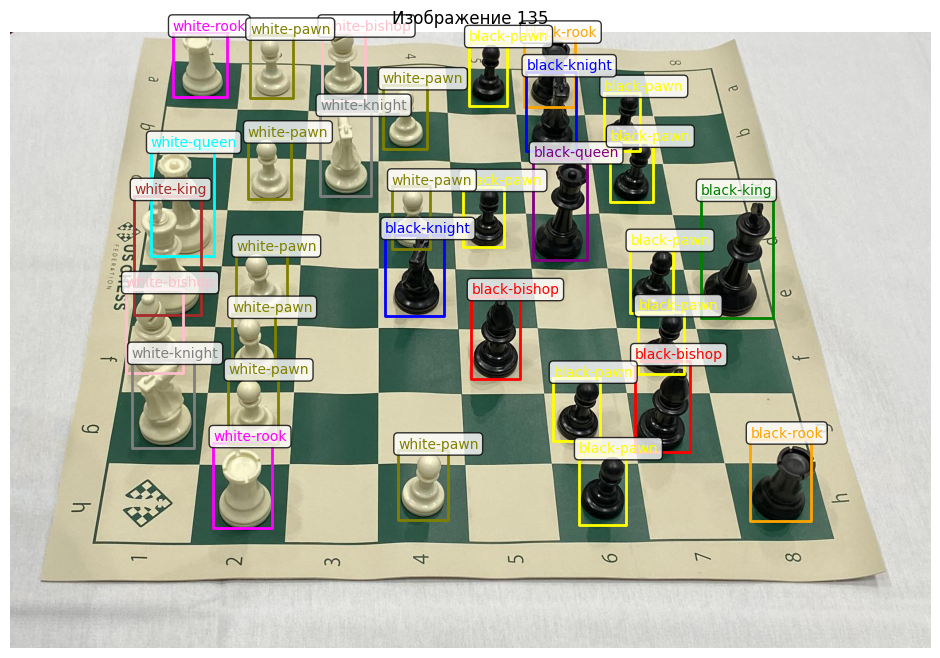

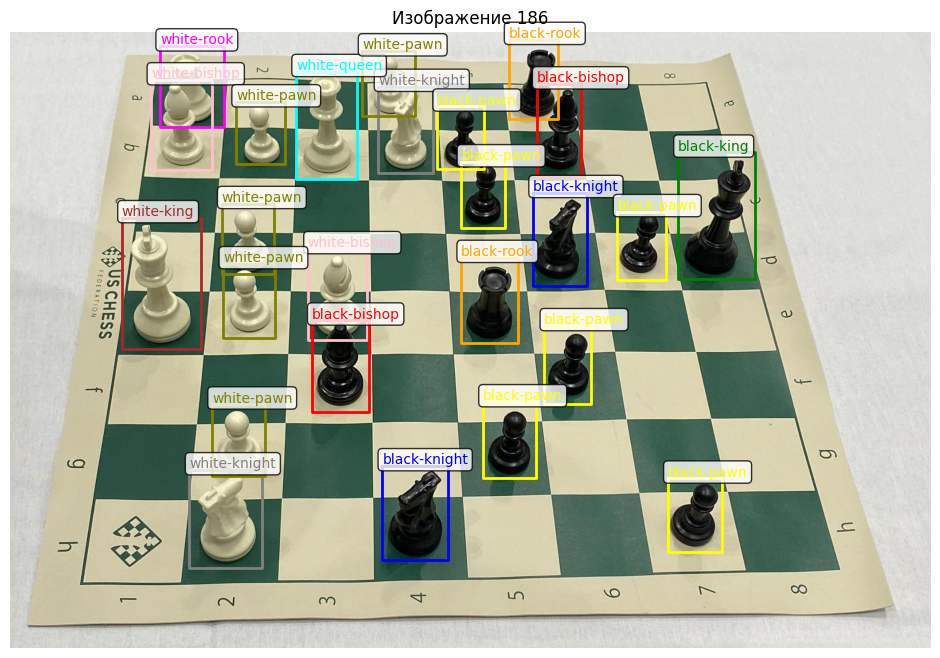

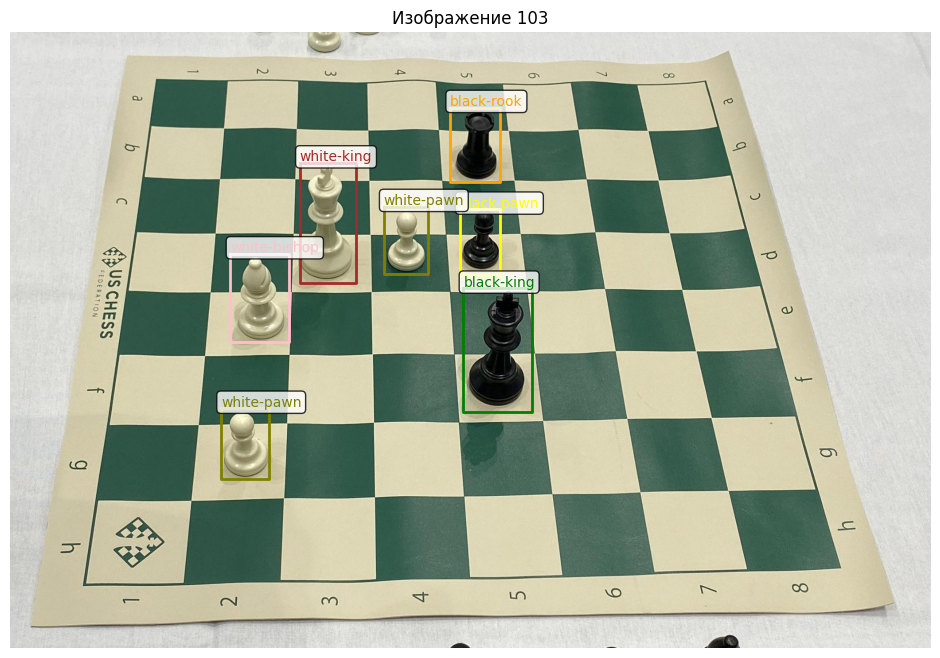

In [ ]:
import random
random_indices = random.sample(range(len(train_images)), 3)
visualize_image_with_boxes(train_images, train_bboxes, train_labels,
                          random_indices, class_names=CLASS_NAMES)

In [ ]:
print(f"Number of training images: {len(train_images)}")
print(f"Number of training bboxes: {len(train_bboxes)}")
print(f"Number of training labels: {len(train_labels)}")

Number of training images: 202
Number of training bboxes: 202
Number of training labels: 202


In [ ]:
from sklearn.cluster import KMeans

def compute_anchors(bboxes_list, num_anchors=9):
    wh = []
    for bboxes in bboxes_list:
        for bbox in bboxes:
            w = bbox[2] - bbox[0]  # width
            h = bbox[3] - bbox[1]  # height
            wh.append([w, h])
    wh = np.array(wh)
    kmeans = KMeans(n_clusters=num_anchors, random_state=0).fit(wh)
    anchors = kmeans.cluster_centers_
    anchors = anchors[np.argsort(anchors[:, 0])]  # Сортировка по ширине
    return anchors

new_anchors = compute_anchors(train_bboxes) * SIZE  # Масштабируем к SIZE=416
yolo_anchors = np.array(new_anchors, dtype=np.float32).reshape(9, 2)
yolo_anchor_masks = np.array([[6,7,8], [3,4,5], [0,1,2]])  # Без изменений

In [ ]:
yolo_anchors

array([[18.984848, 41.18866 ],
       [21.605198, 45.260963],
       [23.054316, 55.70953 ],
       [24.450302, 49.47564 ],
       [27.261383, 62.22669 ],
       [28.069496, 70.78899 ],
       [29.424105, 79.84554 ],
       [29.435135, 56.6697  ],
       [34.524593, 85.564026]], dtype=float32)

In [ ]:
MAX_OBJECTS = 32  # Максимум 32 фигуры на шахматной доске
def data_generator(images, bboxes, labels, batch_size=4):
    while True:
        for i in range(0, len(images), batch_size):
            batch_images = []
            batch_combined = []  # Будет хранить объединенные данные [x1, y1, x2, y2, class]

            for j in range(i, min(i + batch_size, len(images))):
                # Предобработка изображения
                try:
                    img_padded = preprocess_image(images[j], SIZE)
                    batch_images.append(img_padded)
                except Exception as e:
                    print(f"Error processing image {j}: {e}")
                    continue

                # Объединяем bboxes и labels для этого изображения
                if len(bboxes[j]) > 0:
                    # Создаем объединенный массив [x1, y1, x2, y2, class]
                    combined = np.column_stack([bboxes[j], labels[j]])
                else:
                    # Если нет объектов, создаем пустой массив правильной формы
                    combined = np.zeros((0, 5), dtype=np.float32)

                # Паддинг до 100 объектов
                padded_combined = np.zeros((MAX_OBJECTS, 5), dtype=np.float32)
                if len(combined) > 0:
                    padded_combined[:len(combined)] = combined
                batch_combined.append(padded_combined)

            batch_images = np.array(batch_images)
            batch_combined = np.array(batch_combined)

            yield batch_images, transform_targets(batch_combined, yolo_anchors, yolo_anchor_masks, NUM_CLASSES)

# Создаем генераторы с новыми данными
train_gen = data_generator(train_images, train_bboxes, train_labels)
valid_gen = data_generator(valid_images, valid_bboxes, valid_labels)

In [ ]:
def create_tf_dataset(images, bboxes, labels, data_generator_fn, batch_size=4):
    def gen():
        return data_generator_fn(images, bboxes, labels, batch_size)

    output_signature = (tf.TensorSpec(shape=(None, SIZE, SIZE, 3), dtype=tf.float32),
        (
            tf.TensorSpec(shape=(None, 13, 13, 3, 6), dtype=tf.float32),
            tf.TensorSpec(shape=(None, 26, 26, 3, 6), dtype=tf.float32),
            tf.TensorSpec(shape=(None, 52, 52, 3, 6), dtype=tf.float32)
        )
    )

    dataset = tf.data.Dataset.from_generator(gen, output_signature=output_signature)
    return dataset.prefetch(tf.data.AUTOTUNE)

# Использование с явной передачей data_generator
train_dataset = create_tf_dataset(train_images, train_bboxes, train_labels, data_generator)
valid_dataset = create_tf_dataset(valid_images, valid_bboxes, valid_labels, data_generator)

# Соберем модель YOLO v3 по блокам

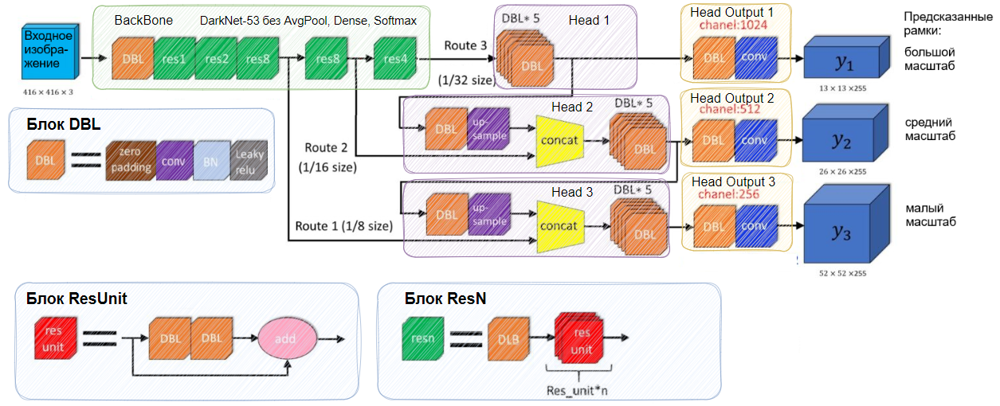

## DarkNet Block Layer (DBL)

Рассмотрим блок DBL, который представляет собой каскад сверточных слоев. Функция  DBL на вход принимает следующие аргументы:
* x - тензор входных данных
* filter - количество фильтров на слой, целое число
* kernel - размер ядра свертки, целое число
* stride - шаг свертки, целое число
* batch_norm - включать ли ветку со слоем BatchNormalization и функцией активации LeakyReLu.

Обратите внимание на первое условие в функции DBL. Если шаг свертки `stride = 1`, то устанавливается `padding = 'same'` и с ним создается сверточный слой. Если шаг свертки `stride = 2`, то перед созданием сверточного слоя во входной тензор, при помощи слоя `ZeroPadding2D`, добавляется отступ из нулей, что бы ядро светки лучше захватило верхний левый угол тензора.

Второе условие в функции зависит от переменной `batch_norm`. Если условие `True`, то выполняет `BatchNormalization` и применяется активационная функция `LeakyReLu`. Данный подход используется для стабилизации обучения, ускорения сходимости и регуляризации модели в слоях.

Когда явно указываем `batch_norm=False` (по умолчанию `True`), то используется линейная функция активации `Linear` без нормализации.


In [ ]:
def DBL(x, filters, kernel, strides=1, batch_norm=True):
    if strides == 1:
        padding = 'same'
    else:
        # Делаем oтступ в виде нулей по контуру изображения, что бы захватить левый верхний угол
        x = ZeroPadding2D(((1, 0), (1, 0)))(x)
        padding = 'valid'
    x = Conv2D(filters=filters, kernel_size=kernel,
              strides=strides, padding=padding,
              use_bias=not batch_norm,  # используем смещение, если нет нормализации
              kernel_regularizer=l2(0.0005))(x)
    if batch_norm:
        x = BatchNormalization(epsilon=0.001)(x)
        x = LeakyReLU(negative_slope=0.1)(x)
    return x



#### Блок **ResUnit**

Функция ResUnit реализует ячейку Residual блока (блок с остаточными связями). Остаточные связи позволяют сохранить извлеченные из изображения карты признаки и передать их на более глубокие слои. Что позволяет сохранить звлеченную информацию в очень глубоких сетях.

Функция Res_unit использует функцию DBL с разными настройками количества фильтров и ядра свертки. Параметры ядра свертки kernel задаются жестко внутри функции.  Для первой `DBL` размер ядра 1, для второй - 3.

Шаг свертки `stride = 1`, установлен по умолчанию в функции DBL и не изменяется.

На входе функции создается прямое соединение `skip_connection` с выходом.

In [ ]:
def ResUnit(x, filters):
    skip_connection  = x
    x = DBL(x, filters // 2, 1)
    x = DBL(x, filters, 3)
    x = Add()([skip_connection , x])
    return x

#### Блок **ResN**

Функция `ResN` реализует `Residual` блок заданных размеров. Сеть Darknet-53 использует Residual блоки кратностью  $×1,×2,×4,×8$ .


Функция получает на вход тензор $x$, который проходит через слой Conv2D с ядром свертки 3х3 и шагом свертки 2 (внутри блока DBL), и его размерность уменьшается в два раза, а затем он проходит через `n` `ResUnit` блоков.

In [ ]:
def ResN(x, filters, blocks):
    x = DBL(x, filters, kernel=3, strides=2)
    for _ in repeat(None, blocks): # цикл по n-блокам (подход с repeat позволяет экономить память)
        x = ResUnit(x, filters)
    return x

### Сеть Darknet (BackBone)

Каскад сверточных слоев (DBL) и остаточных блоков (ResN) позволяют максимально извлекать визуальную информацию из изображения (форма объектов, цвет, яркость, и т.д.). Поэтому сеть Darknet без классификационных выходных слоев называют экстрактор. YOLOv3 использует 3 выхода из сети Darknet-53 для извлечения признаков в трех масштабах Route 1, Route 2 и Route 3.

Реализуем такую сеть с 3 выходами:

In [ ]:
def Darknet(name=None):
    x = inputs = Input([None, None, 3])
    x = DBL(x, 32, 3)
    x = ResN(x, 64, 1)
    x = ResN(x, 128, 2)
    x = Route_1 = ResN(x, 256, 8)
    x = Route_2 = ResN(x, 512, 8)
    Route_3 = ResN(x, 1024, 4)
    return tf.keras.Model(inputs, (Route_1, Route_2, Route_3), name=name)

### Головы YOLOv3

На этапе YOLOv3 о головах в моделе еще не говорилось, однако для понимания более современных моделей YOLO, мы используем такой подход, ведь он идеально отражает "зарождение" этих голов в модели и последующего выделения "шеи" в более поздних версиях.

Рассмотрим внимательно рис. 3.  Нам необходимо написать функцию головы. Для наглядности мы разделим ее на 2 функции: `YoloHead` и `YoloHeadOutput` (`DBL+conv` на схеме). `YoloHead` должна уметь работать как с одним тензором (вход от `Route 3`), так и с двумя тензорами: `Route 2` + выход `Head 1`, аналогично и для `Route 1` + выход `Head 2`. Если на вход поступает кортеж, то внутри функции `YoloHead` кортеж разделяется на два отдельных тензора.

Первый тензор, пришедший с более глубоких слоев, сначала проходит через сверточный слой и слой повышающей дискретизации `UpSampling2D`, чтобы его форма стала такой же, как у второго тензора.

Затем оба тензора, подаются в функцию конкатенации.

Далее функция `YoloHead` пропускает тензор через 5 блоков свертки `DBL`.

Следующий шаг: выходной тензор из функции `YoloHead` проходит еще через одну свертку `DBL` функции `YoloHeadOutput` и поступает на выходной сверточный слой `conv`, который имеет конкретную размерность, зависящую от количества закодированных классов.

In [ ]:
def YoloHead(filters, name=None):
    def layer(x_in):
        if isinstance(x_in, tuple): #
            inputs = Input(x_in[0].shape[1:]), Input(x_in[1].shape[1:])
            x, x_skip = inputs

            x = DBL(x, filters, 1)
            x = UpSampling2D(2)(x)
            x = Concatenate()([x, x_skip])
        else:
            x = inputs = Input(x_in.shape[1:])

        x = DBL(x, filters, 1)
        x = DBL(x, filters * 2, 3)
        x = DBL(x, filters, 1)
        x = DBL(x, filters * 2, 3)
        x = DBL(x, filters, 1)
        return Model(inputs, x, name=name)(x_in)
    return layer

def YoloHeadOutput(filters, anchors, classes, name=None):
    def layer(x_in):

        x = inputs = Input(x_in.shape[1:])
        x = DBL(x, filters * 2, 3)
        x = DBL(x, anchors * (classes + 5), 1, batch_norm=False)
        x = Lambda(lambda x: tf.reshape(x, (-1, tf.shape(x)[1], tf.shape(x)[2],
                                        anchors, classes + 5)))(x)
        return tf.keras.Model(inputs, x, name=name)(x_in)
    return layer

Модель **Darknet** предсказывает ограничивающие рамки в трех разных масштабах. Выход первой головы будет иметь размер 13х13x255, что эквивалентно делению входного изображения сеткой с ячейкой 13х13.

Выход второй головы (масштаб для средних объектов) будет иметь размер 26х26х255, что эквивалентно сетке якорных ячеек (anchor box) 26х26.

Выход третьей головы (масштаб для мелких объектов) будет иметь размер 52х52х255, что соответствует сетке якорых ячеек 52х52.

Размерности получаются следующим образом:
* $13 \times 13 \times 255 = (13, 13, \text{num_sub_anchors} * (4 + 1 + \text{NUM_CLASSES})) = (13, 13, 3*(4+1+80))$
* $26 \times 26 \times 255 = (26, 26, \text{num_sub_anchors} * (4 + 1 + \text{NUM_CLASSES})) = (26, 26, 3*(4+1+80))$
* $52 \times 52 \times 255 = (52, 52, \text{num_sub_anchors} * (4 + 1 + \text{NUM_CLASSES})) = (52, 52, 3*(4+1+80))$

где:
* `num_sub_anchors` - количество анкор боксов (=3);
* `4` - координаты (смещения относительно якорного поля (anchor boxes)) для ограничивающей рамки (bounding box);
* `1` - параметр вероятности нахождения объекта внутри рамки (confidence) или как его еще называют "оценка объектности";
* `NUM_CLASSES`- количество классов, на которых обучена модель.

Наша модель обучена на наборе данных COCO из 80 объектов.



### Якорные рамки (anchor boxes) и ограничивающие рамки (bounding box)

В оригинале используются рамки разных размеров для разных объектов
```
yolo_anchors = np.array([(10, 13), (16, 30), (33, 23), (30, 61), (62, 45),
                        (59, 119), (116, 90), (156, 198), (373, 326)], np.float32) / 416
yolo_anchor_masks = np.array([[6, 7, 8], [3, 4, 5], [0, 1, 2]])
```
Но в нашем случае объекты имеют более постоянные размеры, и мы пересчитали их при загрузке датасета

In [ ]:
def yolo_boxes(pred, anchors, classes):
    # На входе pred размера (S, S, 3, (1+4+NUM_CLASSES))

    grid_size = tf.shape(pred)[1] # S ячеек в сетке

    # В box_xy и box_wh помещаем сразу по 2 переменные (tx, ty) и (tw, th)
    box_xy, box_wh, score, class_probs = tf.split(pred, (2, 2, 1, classes), axis=-1) # раскладываем предсказанную карту по переменным

    # Применяем сигмоидные функции
    box_xy = tf.sigmoid(box_xy)
    score = tf.sigmoid(score)
    class_probs = tf.sigmoid(class_probs)
    pred_box = tf.concat((box_xy, box_wh), axis=-1)


    # Построим сетку S x S
    grid = tf.meshgrid(tf.range(grid_size), tf.range(grid_size))
    grid = tf.expand_dims(tf.stack(grid, axis=-1), axis=2)

    # Привяжем box_xy к ячейкам сетки, учтем смещения (и снова нормируем к диапазону 0, 1)
    # Фактически мы вычисляем центральное положение рамки относительно размеров сетки (якорного поля)
    b_xy = (box_xy + tf.cast(grid, tf.float32)) /  tf.cast(grid_size, tf.float32) # вычисляем b_xy: (bx, by)

    b_wh = tf.exp(box_wh) * anchors # вычисляем b_wh: (bw, bh), ширина и высота рамки bbox

    box_x1y1 = b_xy - b_wh / 2
    box_x2y2 = b_xy + b_wh / 2
    bbox = tf.concat([box_x1y1, box_x2y2], axis=-1) # задаем рамку bbox, как 2 координаты углов


    return bbox, score, class_probs, pred_box

### Подавление не максимумов NMS

Модель YOLOv3 рассчитывает вероятности для 10 647 базовых якорных рамок. После вычисления параметра **score** (confidence), все якорные рамки не содержащие объекты удаляются. Остаются только те, у которых вероятность содержания в них объекта выше заданного порога.

К оставшимся рамкам применяют алгоритм `NMS`. Алгоритм `NMS` берет две рамки (bounding boх) с наибольшими вероятностями, например 0.98 и 0.99, и вычисляет между ними `IoU` и если значение превышает заданный порог `YOLO_IOU_THRESHOLD`, то данная рамка ограничивает один и тот же объект, соответственно рамку (bboх) с меньшей вероятностью можно удалить.

Затем берется следующая по вероятности рамка и т.д. до тех пор пока не останется только одна.

Если же `IoU` ниже заданного порога, то скорее всего рамки описывают два разных объекта, в этом случае обе рамки остаются.

Для решения заданной задачи мы используем готовый алгоритм `tf.image.combined_non_max_suppression`.

In [ ]:
@tf.function(jit_compile=False)
def nonMaximumSuppression(outputs, anchors, masks, classes):
    boxes, conf, out_type = [], [], []

    # Блок преобразования трех выходов разных масштабов
    for output in outputs:
        boxes.append(tf.reshape(output[0], (tf.shape(output[0])[0], -1, tf.shape(output[0])[-1])))
        conf.append(tf.reshape(output[1], (tf.shape(output[1])[0], -1, tf.shape(output[1])[-1])))
        out_type.append(tf.reshape(output[2], (tf.shape(output[2])[0], -1, tf.shape(output[2])[-1])))

    # Конкатенируем три масштаба в один
    bbox = tf.concat(boxes, axis=1)
    confidence = tf.concat(conf, axis=1)
    class_probs = tf.concat(out_type, axis=1)

    scores = confidence * class_probs # Оценки считаем как произведение оценок объектности на вероятности классов

    # Применяем NMS из пакета tensorflow (работаем с документацией, смотрим параметры самостоятельно: https://www.tensorflow.org/api_docs/python/tf/image/combined_non_max_suppression)
    boxes, scores, classes, valid_detections = tf.image.combined_non_max_suppression(
        boxes=tf.reshape(bbox, (tf.shape(bbox)[0], -1, 1, 4)),
        scores=tf.reshape(
            scores, (tf.shape(scores)[0], -1, tf.shape(scores)[-1])),
        max_output_size_per_class=100,
        max_total_size=100,
        iou_threshold=YOLO_IOU_THRESHOLD,
        score_threshold=YOLO_SCORE_THRESHOLD)

    return boxes, scores, classes, valid_detections

### Собираем модель

Так как нам необходимо будет загрузить веса предобученной модели и определить имена слоев, в которые необходимо встроить предобученные веса.

In [ ]:
!wget https://storage.yandexcloud.net/academy.ai/CV/yolov3.weights

--2025-10-08 20:19:58--  https://storage.yandexcloud.net/academy.ai/CV/yolov3.weights
Resolving storage.yandexcloud.net (storage.yandexcloud.net)... 213.180.193.243, 2a02:6b8::1d9
Connecting to storage.yandexcloud.net (storage.yandexcloud.net)|213.180.193.243|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 248007048 (237M) [application/x-www-form-urlencoded]
Saving to: ‘yolov3.weights’

yolov3.weights      100%[===================>] 236.52M  21.9MB/s    in 12s     

2025-10-08 20:20:11 (19.6 MB/s) - ‘yolov3.weights’ saved [248007048/248007048]



In [ ]:
YOLO_V3_LAYERS = ['yolo_darknet']

Теперь собираем модель и не забываем именовать слои, которым необходимо задать веса.

In [ ]:
def YoloV3(size=None, channels=3, anchors=yolo_anchors,
            masks=yolo_anchor_masks, classes=NUM_CLASSES, training=False):
    # Вход
    x = inputs = Input([size, size, channels])

    # Модель Darknet с тремя выходами
    Route_1, Route_2, Route_3 = Darknet(name='yolo_darknet')(x)

    # Определяем 3 головы с разным числом фильтров
    x = YoloHead(512, name='yolo_head_1')(Route_3)
    output_0 = YoloHeadOutput(512, len(masks[0]), classes, name='yolo_output_1')(x)

    x = YoloHead(256, name='yolo_head_2')((x, Route_2))
    output_1 = YoloHeadOutput(256, len(masks[1]), classes, name='yolo_output_2')(x)

    x = YoloHead(128, name='yolo_head_3')((x, Route_1))
    output_2 = YoloHeadOutput(128, len(masks[2]), classes, name='yolo_output_3')(x)

    if training: # заложим модель для обучения (понадобиться в домашней работе)
        return Model(inputs, (output_0, output_1, output_2), name='yolov3')

    # Перегоняем предсказанные якорные рамки в boundary box для трех выходов
    boxes_0 = Lambda(lambda x: yolo_boxes(x, anchors[masks[0]], classes),
                  name='yolo_boxes_0')(output_0)
    boxes_1 = Lambda(lambda x: yolo_boxes(x, anchors[masks[1]], classes),
                  name='yolo_boxes_1')(output_1)
    boxes_2 = Lambda(lambda x: yolo_boxes(x, anchors[masks[2]], classes),
                  name='yolo_boxes_2')(output_2)

    # Отсекаем все лишнее алгоритмом NMS
    outputs = Lambda(lambda x: nonMaximumSuppression(x, anchors, masks, classes),
                  name='nonMaximumSuppression')((boxes_0[:3], boxes_1[:3], boxes_2[:3]))

    return Model(inputs, outputs, name='yolov3') # возвращаем модель для инференса

Определим функцию загрузки весов:

In [ ]:
# The function to load weights from pretrained model

def load_darknet_weights(model, weights_file):

    wf = open(weights_file, 'rb') # загружаем файл

    # Читаем из файла по элементам (первые 5, версия файла)
    major, minor, revision, seen, _ = np.fromfile(wf, dtype=np.int32, count=5)
    layers = YOLO_V3_LAYERS # слои для загрузки

    for layer_name in layers:
        sub_model = model.get_layer(layer_name)      # извлекаем блоки слоев из модели по имени
        for i, layer in enumerate(sub_model.layers): # пробегаемся по отдельным слоям блоков
            if not layer.name.startswith('conv2d'):  # пропускаем не сверточные слои
                continue
            batch_norm = None
            if i + 1 < len(sub_model.layers) and \
                sub_model.layers[i + 1].name.startswith('batch_norm'):
                    batch_norm = sub_model.layers[i + 1]  # фиксируем если за слоем будет батч-нормализация



            filters = layer.filters                   # фильтров в слое
            size = layer.kernel_size[0]               # размер ядра в слое
            #in_dim = layer.input_shape[-1]           # input_shape в слоях Conv2d больше не поддерживается
            in_dim = layer.get_weights()[0].shape[2]  # входная размерность слоя

            # Вспоминаем структуру DBL: если нет нормализации, то добавляется смещение
            if batch_norm is None:
                conv_bias = np.fromfile(wf, dtype=np.float32, count=filters) # считываем веса для смещения
            else:
                bn_weights = np.fromfile(wf, dtype=np.float32, count=4*filters) # считываем веса для нормализации
                bn_weights = bn_weights.reshape((4, filters))[[1, 0, 2, 3]]     # меняем форму

            conv_shape = (filters, in_dim, size, size)    # размерности сверточного слоя
            conv_weights = np.fromfile(wf, dtype=np.float32, count=np.prod(conv_shape))  # считываем веса для сверточного слоя
            conv_weights = conv_weights.reshape(conv_shape).transpose([2, 3, 1, 0]) # меняем форму данных весов, решейпим и транспонируем

            # Если нет нормализации, то добавляем веса + смещение
            if batch_norm is None:
                layer.set_weights([conv_weights, conv_bias])
            else:
                # Если есть нормализации, то добавляем веса в сверточный слой и в следующий за ним слой нормализации
                layer.set_weights([conv_weights])
                batch_norm.set_weights(bn_weights)

    wf.close()

### Вспомагательные функции

#### Функция вычисления IoU

IoU (Intersection over Union) выражает отношение площади пересечения рамок к площади их объединения. Метрика необходима для определения степени перекрытия двух ограничивающих рамок (bounding box) и используется для фильтрации дублирующих обнаружений с помощью заданного порогового значения.

Функция interval_overlap вычисляет длину пересечения двух отрезков на одной оси (X или Y).

Имея вспомагательную функцию, мы можем легко выразить IoU по формулам из первой части урока:

In [ ]:
def intersectionOverUnion(boxes_pred, boxes_true):
    box1_x1 = boxes_pred[..., 0:1]
    box1_y1 = boxes_pred[..., 1:2]
    box1_x2 = boxes_pred[..., 2:3]
    box1_y2 = boxes_pred[..., 3:4]
    box2_x1 = boxes_true[..., 0:1]
    box2_y1 = boxes_true[..., 1:2]
    box2_x2 = boxes_true[..., 2:3]
    box2_y2 = boxes_true[..., 3:4]

    x1 = tf.maximum(box1_x1, box2_x1)
    y1 = tf.maximum(box1_y1, box2_y1)
    x2 = tf.minimum(box1_x2, box2_x2)
    y2 = tf.minimum(box1_y2, box2_y2)

    intersection = tf.maximum(x2 - x1, 0) * tf.maximum(y2 - y1, 0)
    box1_area = (box1_x2 - box1_x1) * (box1_y2 - box1_y1)
    box2_area = (box2_x2 - box2_x1) * (box2_y2 - box2_y1)
    union_area = box1_area + box2_area - intersection
    iou = intersection / (union_area + tf.keras.backend.epsilon())
    return iou

#### Функция потерь

Далее определим пользовательскую функцию потерь или функцию ошибки YOLOv3, что собственно одно и то же! Вычисление потерь включает алгоритмы для исключения ложных срабатываний на основе порогов IoU и учитывает размер ячеек. Функция оценивает расхождения между прогнозируемыми и истинными значениями в ограничивающих рамках, оценках объектности и вероятностях классов, фиксируя тонкости идентификации объектов в стиле YOLO и помогая повысить точность модели во время обучения.

Функция ошибки состоит из четырех частей:
* `xy_loss` - ошибка положения (xy)
* `wh_loss` - ошибка ширины и высоты(wh)
* `obj_loss` - ошибка объектности (наличие объекта в ячейке)
* `class_loss` - ошибка классификации

Или все вместе: `loss = xy_loss + wh_loss + obj_loss + class_loss`

Данная функция нам не понадорбится в уроке, но пригодится в домашней работе, поэтому придется нам ее изучить, хотя бы поверхностно.



##### **xy_loss**

Ошибку можно записать следующим образом:

`xy_loss = obj_mask * box_loss_scale * tf.reduce_sum(tf.square(true_xy - pred_xy), axis=-1)`

Где:

* box_loss_scale - коэффициент из первой статьи YOLO, цель которого регулировать баланс приоритета нейросети, при обучении, между локализации объектов и их классификацией. В оригинальной статье `box_loss_scale = 5`. В некоторых реализациях встречается подход: для меньших рамок больше ошибка, и наоборот!

* true_xy - содержит значения $t_x$ и $t_y$ положение центра рамки (bounding box) по отношению к центру ячейки.

* pred_xy - содержит значения $t_x$ и $t_y$ предсказаное положение центра рамки. Чем меньше эта ошибка, тем ближе предсказанный ценр рамки к центру ячейки.

Здесь мы записываем аналог среднеквадратичного отклонения в матричном виде.

Учитывая, что некоторые ячейки могут вообще не содержать объектов, то для исключения ошибки из расчетов, мы вводим `obj_mask`, который принимает значения $0$ (отсутствие объекта в ячейке) или $1$ (присутствие объекта в ячейке). Если ячейка пустая, то и ошибка не учитывается.

##### **wh_loss**



`wh_loss = obj_mask * box_loss_scale * tf.reduce_sum(tf.square(true_wh - pred_wh), axis=-1)`


##### **obj_loss**

Это ошибка объектности, которая показывает насколько вероятно наличие объекта в текущей ячейки:

        
`obj_loss = binary_crossentropy(true_obj, pred_obj)`

`obj_loss = obj_mask * obj_loss + (1 - obj_mask) * ignore_mask * obj_loss`
        


`ignore_mask` рассчитывается следующим образом:

1. С помощью функции `tf.boolean_mask` убираются из `true_box` рамки без объектов, а новые результат записывается в переменную `true_box_flat`.
2.  Hасчитываются значения `IoU` для предсказанных рамок и используя функцию `tf.reduce_max` сохраняем предсказанные рамки только с максимальным `IoU` в переменную `best_iou`.
3. Создается маска, путем сравнения `best_iou` с заранее определенным уровнем `ignore_thresh`.
4. Спомощью функции `tf.cast` задает формат значениям маски равным `float32`.


Важно отметить, что так как `ignore_mask` расчитывается с помощью `IoU`, то чем больше нейросеть ошиблась, тем выше будет итоговая ошибка `obj_loss`.

```python
true_box_flat = tf.boolean_mask(true_box, tf.cast(obj_mask, tf.bool))
best_iou = tf.reduce_max(intersectionOverUnion(
    pred_box, true_box_flat), axis=-1)
ignore_mask = tf.cast(best_iou < ignore_thresh, tf.float32)
```

##### **class_loss**

`class_loss = obj_mask * sparse_categorical_crossentropy(true_class_idx, pred_class)`

Следующая ошибка - это ошибка классификации. Мы используем 80 классов, а значит логично использовать разряженную категориальную кросс-энтропию. Полученную ошибку мы также умножаем ее на `obj_mask`, что бы учитывать только те ячейки, в которых есть объект.

Теперь мы можем записать функцию расчета суммарной ошибки целиком. В качестве порога для вычисления `obj_loss` возьмем `ignore_thresh=0.5`:

#### Общий Loss

In [ ]:
def YoloLoss(anchors, classes=80, ignore_thresh=0.5):
    def yolo_loss(y_true, y_pred):

        # 1. Преобразуем все предсказанные выходы
        # y_pred: (batch_size, grid, grid, anchors, (x, y, w, h, obj, ...cls))
        # с функцией yolo_boxes мы уже знакомы
        pred_box, pred_obj, pred_class, pred_xywh = yolo_boxes(
            y_pred, anchors, classes)
        pred_xy = pred_xywh[..., 0:2]
        pred_wh = pred_xywh[..., 2:4]

        # 2. Преобразуем все реальные значения
        # y_true: (batch_size, grid, grid, anchors, (x1, y1, x2, y2, obj, cls))
        true_box, true_obj, true_class_idx = tf.split(
            y_true, (4, 1, 1), axis=-1)
        true_xy = (true_box[..., 0:2] + true_box[..., 2:4]) / 2
        true_wh = true_box[..., 2:4] - true_box[..., 0:2]

        # Чем меньше рамка, тем больше ошибка
        box_loss_scale = 2 - true_wh[..., 0] * true_wh[..., 1]

        # 3. Инвертируем  уравнений красного прямоугольника inverting the pred box equations
        grid_size = tf.shape(y_true)[1]
        grid = tf.meshgrid(tf.range(grid_size), tf.range(grid_size))
        grid = tf.expand_dims(tf.stack(grid, axis=-1), axis=2)
        true_xy = true_xy * tf.cast(grid_size, tf.float32) - \
            tf.cast(grid, tf.float32)
        true_wh = tf.math.log(true_wh / anchors)
        true_wh = tf.where(tf.math.is_inf(true_wh),
                      tf.zeros_like(true_wh), true_wh)

        # 4. Вычисляем ignore_mask
        obj_mask = tf.squeeze(true_obj, -1)
        true_box_flat = tf.boolean_mask(true_box, tf.cast(obj_mask, tf.bool))
        best_iou = tf.map_fn(lambda x: tf.reduce_max(intersectionOverUnion(x[0], x[1]), axis=-1),
                             (pred_box, true_box_flat), dtype=tf.float32)
        ignore_mask = tf.cast(best_iou < ignore_thresh, tf.float32)

        # 5. Вычисляем все функции ошибок
        xy_loss = obj_mask * box_loss_scale * \
            tf.reduce_sum(tf.square(true_xy - pred_xy), axis=-1)
        wh_loss = obj_mask * box_loss_scale * \
            tf.reduce_sum(tf.square(true_wh - pred_wh), axis=-1)

        obj_loss = binary_crossentropy(true_obj, pred_obj)
        obj_loss = obj_mask * obj_loss + \
            (1 - obj_mask) * ignore_mask * obj_loss

        # Можно использовать как binary_crossentropy, так и sparse_categorical_crossentropy
        class_loss = obj_mask * sparse_categorical_crossentropy(
            true_class_idx, pred_class)

        # 6. Все функции ошибок суммируются по осям для каждого пакета (batch, gridx, gridy, anchors) => (batch, 1)
        xy_loss = tf.reduce_sum(xy_loss, axis=(1, 2, 3))
        wh_loss = tf.reduce_sum(wh_loss, axis=(1, 2, 3))
        obj_loss = tf.reduce_sum(obj_loss, axis=(1, 2, 3))
        class_loss = tf.reduce_sum(class_loss, axis=(1, 2, 3))

        # Общая суммарная ошибка
        return xy_loss + wh_loss + obj_loss + class_loss
    return yolo_loss

In [ ]:
def YoloLoss(anchors, classes=NUM_CLASSES, ignore_thresh=0.5):
    def yolo_loss(y_true, y_pred):
        # Define per-image loss computation
        def compute_loss_per_image(image_data):
            pred, true = image_data  # Single image: pred (grid, grid, anchors, classes+5), true (grid, grid, anchors, 6)

            # 1. Transform predictions
            pred_box, pred_obj, pred_class, pred_xywh = yolo_boxes(pred, anchors, classes)
            pred_xy = pred_xywh[..., 0:2]
            pred_wh = pred_xywh[..., 2:4]

            # 2. Transform ground truth
            true_box, true_obj, true_class_idx = tf.split(true, (4, 1, 1), axis=-1)
            true_xy = (true_box[..., 0:2] + true_box[..., 2:4]) / 2
            true_wh = true_box[..., 2:4] - true_box[..., 0:2]
            box_loss_scale = 2 - true_wh[..., 0] * true_wh[..., 1]

            # 3. Invert equations for ground truth
            grid_size = tf.shape(true)[0]  # Assuming square grid
            grid = tf.meshgrid(tf.range(grid_size), tf.range(grid_size))
            grid = tf.expand_dims(tf.stack(grid, axis=-1), axis=2)
            true_xy = true_xy * tf.cast(grid_size, tf.float32) - tf.cast(grid, tf.float32)
            true_wh = tf.math.log(true_wh / anchors)
            true_wh = tf.where(tf.math.is_inf(true_wh), tf.zeros_like(true_wh), true_wh)

            # 4. Compute ignore_mask per image
            obj_mask = tf.squeeze(true_obj, -1)
            true_box_flat = tf.boolean_mask(true_box, tf.cast(obj_mask, tf.bool))  # (num_true, 4)
            pred_box_flat = tf.reshape(pred_box, (-1, 4))  # (num_pred, 4)
            num_true = tf.shape(true_box_flat)[0]

            ignore_mask = tf.cond(
                tf.equal(num_true, 0),
                lambda: tf.zeros(tf.shape(pred_box_flat)[0], dtype=tf.float32),
                lambda: tf.cast(
                    tf.reduce_max(
                        intersectionOverUnion(pred_box_flat, true_box_flat),
                        axis=-1
                    ) < ignore_thresh,
                    tf.float32
                )
            )
            ignore_mask = tf.reshape(ignore_mask, tf.shape(obj_mask))  # Restore shape (grid, grid, anchors)

            # 5. Compute loss terms
            xy_loss = obj_mask * box_loss_scale * tf.reduce_sum(tf.square(true_xy - pred_xy), axis=-1)
            wh_loss = obj_mask * box_loss_scale * tf.reduce_sum(tf.square(true_wh - pred_wh), axis=-1)

            obj_loss = binary_crossentropy(true_obj, pred_obj)
            obj_loss = obj_mask * obj_loss + (1 - obj_mask) * ignore_mask * obj_loss

            class_loss = obj_mask * sparse_categorical_crossentropy(true_class_idx, pred_class)

            # 6. Sum losses for this image (equivalent to reduce_sum over (grid_x, grid_y, anchors))
            xy_loss_sum = tf.reduce_sum(xy_loss)
            wh_loss_sum = tf.reduce_sum(wh_loss)
            obj_loss_sum = tf.reduce_sum(obj_loss)
            class_loss_sum = tf.reduce_sum(class_loss)

            return xy_loss_sum + wh_loss_sum + obj_loss_sum + class_loss_sum  # Scalar per image

        # Apply vectorized_map over batch
        elems = (y_pred, y_true)  # Both (batch, grid, grid, anchors, ...)
        per_image_losses = tf.vectorized_map(compute_loss_per_image, elems, fallback_to_while_loop=True)

        # Aggregate over batch (e.g., mean for typical loss)
        return tf.reduce_mean(per_image_losses)

    return yolo_loss

#### Преобразование ограничивающих рамок

Функция `transform_targets_for_output` преобразует ограничивающие рамки в целевой тензор, адаптированный для конкретной выходной сетки в модели обнаружения объектов, с учетом информации о блоках привязки, положениях сетки и достоверности определения объекта, что облегчает обучение архитектурам, подобным YOLO.

Функция `transform_targets` подготавливает целевые тензоры для моделей обнаружения объектов, подобных YOLO, путем включения меток определения истинности, блоков привязок и информации о классе. Он вычисляет индексы привязки на основе пересечений при объединении, добавляет их к меткам и генерирует целевые тензоры для нескольких выходных сеток с различными масштабами, что важно для эффективного обучения модели.

Эти функции работают вместе, чтобы подготовить метки истинности для обучения модели YOLO с несколькими выходными масштабами и конфигурациями привязок.

In [ ]:
@tf.function
def transform_targets_for_output(y_true, grid_size, anchor_idxs, classes):
    N = tf.shape(y_true)[0]
    y_true_out = tf.zeros((N, grid_size, grid_size, tf.shape(anchor_idxs)[0], 6))

    anchor_idxs = tf.cast(anchor_idxs, tf.int32)  # Явное преобразование

    indexes = tf.TensorArray(tf.int32, 1, dynamic_size=True)
    updates = tf.TensorArray(tf.float32, 1, dynamic_size=True)
    idx = 0

    for i in tf.range(N):
        for j in tf.range(tf.shape(y_true)[1]):
            # Исправленная проверка на наличие объекта
            if tf.reduce_all(tf.equal(y_true[i][j][0:4], 0)):
                continue

            anchor_eq = tf.equal(
                anchor_idxs, tf.cast(y_true[i][j][5], tf.int32))  # Явное преобразование

            if tf.reduce_any(anchor_eq):
                box = y_true[i][j][0:4]
                box_xy = (y_true[i][j][0:2] + y_true[i][j][2:4]) / 2

                # Явное преобразование всех индексов к int32
                anchor_idx = tf.cast(tf.where(anchor_eq), tf.int32)
                grid_xy = tf.cast(box_xy // (1/grid_size), tf.int32)  # int32

                # Исправленная строка - все индексы в int32
                indexes = indexes.write(
                    idx, [tf.cast(i, tf.int32), grid_xy[1], grid_xy[0], anchor_idx[0][0]])
                updates = updates.write(
                    idx, [box[0], box[1], box[2], box[3], 1.0, tf.cast(y_true[i][j][4], tf.float32)])
                idx += 1

    return tf.tensor_scatter_nd_update(
        y_true_out, indexes.stack(), updates.stack())


# The transform_targets function now expects padded y_train (batch_size, MAX_OBJECTS, 5)
def transform_targets(y_train, anchors, anchor_masks, classes):
    outputs = []
    grid_size = SIZE // 32
    batch_size = tf.shape(y_train)[0]
    max_objects = tf.shape(y_train)[1]

    anchors = tf.cast(anchors, tf.float32)

    # Reshape for broadcasting
    y_train_reshaped = tf.reshape(y_train, (batch_size * max_objects, 5))
    box_wh = y_train_reshaped[..., 2:4] - y_train_reshaped[..., 0:2] # (batch * max_objects, 2)

    # Avoid large tensor expansions
    anchor_area = anchors[..., 0] * anchors[..., 1]  # (9,)
    box_area = box_wh[..., 0] * box_wh[..., 1]  # (batch * max_objects,)

    # Compute IoU more efficiently
    best_iou = tf.zeros((batch_size * max_objects,))
    best_anchor_idx = tf.zeros((batch_size * max_objects,), dtype=tf.int32)

    for i, anchor in enumerate(anchors):
        anchor_w, anchor_h = anchor[0], anchor[1]

        # Compute IoU for each anchor
        inter_w = tf.minimum(box_wh[..., 0], anchor_w)
        inter_h = tf.minimum(box_wh[..., 1], anchor_h)
        intersection = inter_w * inter_h

        anchor_area_expanded = anchor_w * anchor_h
        union = box_area + anchor_area_expanded - intersection

        iou = intersection / (union + 1e-8)

        # Update best IoU and indices
        better_mask = iou > best_iou
        best_iou = tf.where(better_mask, iou, best_iou)
        best_anchor_idx = tf.where(better_mask, i, best_anchor_idx)

    # Add best anchor indices and reshape back
    anchor_idx = tf.cast(best_anchor_idx, tf.float32)
    anchor_idx = tf.reshape(anchor_idx, (batch_size, max_objects, 1))
    y_train = tf.concat([y_train, anchor_idx], axis=-1) # Shape (batch_size, MAX_OBJECTS, 6)


    # Create outputs for each scale
    for anchor_idxs in anchor_masks:
        # Apply transform_targets_for_output to each image in the batch
        output = tf.map_fn(lambda x: transform_targets_for_output(tf.expand_dims(x, axis=0), grid_size, anchor_idxs, classes),
                           y_train, fn_output_signature=tf.TensorSpec(shape=(1, grid_size, grid_size, tf.shape(anchor_idxs)[0], 6), dtype=tf.float32))
        outputs.append(tf.squeeze(output, axis=1)) # Remove the extra dimension added by map_fn
        grid_size *= 2

    return tuple(outputs)


def preprocess_image(x_train, size):
    return (tf.image.resize(x_train, (size, size))) / 255

#### Функции детекции объектов и отображения предсказанной рамки

Функция `draw_outputs` отображает на изображении `img` ограничивающие рамки , имена классов, вероятности объектов, которые сетка нам предсказала.

Предсказанные данные для отображения вычисляются в функции `detect_objects`, которой на вход подается путь до изображения и `white_list` (используется для ограничения классов, по которым проводить детекцию).

In [ ]:
def draw_outputs(img, outputs, class_names, white_list=None):
    boxes, score, classes, nums = outputs # распознанные объекты
    boxes, score, classes, nums = boxes[0], score[0], classes[0], nums[0]
    wh = np.flip(img.shape[0:2]) # предсказанные ширина и высота
    for i in range(nums):
        # Отображаем объекты только из white_list
        if class_names[int(classes[i])] not in white_list:
            continue

        # Предсказанные координаты нижнего левого и правого верхнего углов
        x1y1 = tuple((np.array(boxes[i][0:2]) * wh).astype(np.int32))
        x2y2 = tuple((np.array(boxes[i][2:4]) * wh).astype(np.int32))

        # Рисуем прямоугольник по двум предсказанным координатам
        img = cv2.rectangle(img, x1y1, x2y2, (255, 0, 0), 1)

        # Выводим имя класса предсказанного объекта и оценку
        img = cv2.putText(img, '{} {:.2f}'.format(
            class_names[int(classes[i])], score[i]),
            x1y1, cv2.FONT_HERSHEY_COMPLEX_SMALL, 1, (0, 0, 0), 1)
    return img

In [ ]:
def detect_objects(model, img_path, white_list=None):
    image = img_path # путь к файлу
    img = tf.image.decode_image(open(image, 'rb').read(), channels=3) # загружаем изображение как тензор

    img = tf.expand_dims(img, 0) # добавляем размерность
    original_shape = img.shape[:2]
    img = preprocess_image(img, SIZE) # ресайзим изображение
    boxes, scores, classes, nums = model.predict(img) # делаем предсказание

    img = cv2.imread(image) # считываем изображение как картинку, чтобы на нем рисовать
    # Отрисовываем на картинке предсказанные объекты
    wh = np.array(original_shape)[::-1]
    img = draw_outputs(img, (boxes, scores, classes, nums), CLASS_NAMES, white_list)

    # Сохраняем изображения с предсказанными объектами
    base_name = os.path.basename(img_path)
    output_filename = 'detected_' + base_name
    output_path = os.path.join(os.path.dirname(img_path), output_filename)
    cv2.imwrite(output_path, img)

    # Открываем сохраненные изображения и выводим на экран
    detected = Image.open(output_path)
    detected.show()

    return boxes, scores, classes, nums

## Оценка модели

А теперь создаем модель, загружаем веса, задаем имена классов и проверяем как работает модель:

In [ ]:
yolo = YoloV3(classes=NUM_CLASSES, training=True)

In [ ]:
load_darknet_weights(yolo, 'yolov3.weights')

In [ ]:
yolo.save_weights(CHECKPOINTS)

# Обучение

In [ ]:
batch_images, batch_labels = next(train_gen)
print(f"Batch images shape: {batch_images.shape}")
print(f"Batch labels type: {type(batch_labels)}")
print(f"Number of output tensors: {len(batch_labels)}")

# Проверим содержимое
print(f"First image in batch shape: {batch_images[0].shape}")

Batch images shape: (4, 416, 416, 3)
Batch labels type: <class 'tuple'>
Number of output tensors: 3
First image in batch shape: (416, 416, 3)


In [ ]:
for layer in yolo.layers:
    if 'yolo_output' or 'yolo_head' in layer.name:
        layer.trainable = True
    else:
        layer.trainable = False

In [ ]:
losses = [YoloLoss(yolo_anchors[m], NUM_CLASSES) for m in yolo_anchor_masks]
optimizer = tf.keras.optimizers.Adam(learning_rate=1e-4, beta_1=0.9, beta_2=0.999)

In [ ]:
yolo.compile(optimizer=optimizer, loss=losses)

In [ ]:
history = yolo.fit(train_dataset, epochs=50, validation_data=valid_dataset)

Epoch 1/50


InvalidArgumentError: Graph execution error:

Detected at node PyFunc defined at (most recent call last):
<stack traces unavailable>
2 root error(s) found.
  (0) INVALID_ARGUMENT:  TypeError: in user code:

    File "/tmp/ipython-input-868130971.py", line 34, in transform_targets_for_output  *
        indexes = indexes.write(

    TypeError: Cannot convert a list containing a tensor of dtype <dtype: 'int64'> to <dtype: 'int32'> (Tensor is: <tf.Tensor 'while/while/cond_1/cond_1/cond/strided_slice_12:0' shape=() dtype=int64>)

Traceback (most recent call last):

  File "/usr/local/lib/python3.12/dist-packages/tensorflow/python/ops/script_ops.py", line 269, in __call__
    ret = func(*args)
          ^^^^^^^^^^^

  File "/usr/local/lib/python3.12/dist-packages/tensorflow/python/autograph/impl/api.py", line 643, in wrapper
    return func(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^

  File "/usr/local/lib/python3.12/dist-packages/tensorflow/python/data/ops/from_generator_op.py", line 198, in generator_py_func
    values = next(generator_state.get_iterator(iterator_id))
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^

  File "/tmp/ipython-input-1197731472.py", line 34, in data_generator
    yield batch_images, transform_targets(batch_combined, yolo_anchors, yolo_anchor_masks, NUM_CLASSES)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^

  File "/tmp/ipython-input-868130971.py", line 92, in transform_targets
    output = tf.map_fn(lambda x: transform_targets_for_output(tf.expand_dims(x, axis=0), grid_size, anchor_idxs, classes),
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^

  File "/usr/local/lib/python3.12/dist-packages/tensorflow/python/util/deprecation.py", line 660, in new_func
    return func(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^

  File "/usr/local/lib/python3.12/dist-packages/tensorflow/python/util/deprecation.py", line 588, in new_func
    return func(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^

  File "/usr/local/lib/python3.12/dist-packages/tensorflow/python/ops/map_fn.py", line 637, in map_fn_v2
    return map_fn(
           ^^^^^^^

  File "/usr/local/lib/python3.12/dist-packages/tensorflow/python/util/deprecation.py", line 588, in new_func
    return func(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^

  File "/usr/local/lib/python3.12/dist-packages/tensorflow/python/ops/map_fn.py", line 497, in map_fn
    _, r_a = while_loop.while_loop(
             ^^^^^^^^^^^^^^^^^^^^^^

  File "/usr/local/lib/python3.12/dist-packages/tensorflow/python/ops/while_loop.py", line 488, in while_loop
    loop_vars = body(*loop_vars)
                ^^^^^^^^^^^^^^^^

  File "/usr/local/lib/python3.12/dist-packages/tensorflow/python/ops/while_loop.py", line 479, in <lambda>
    body = lambda i, lv: (i + 1, orig_body(*lv))
                                 ^^^^^^^^^^^^^^

  File "/usr/local/lib/python3.12/dist-packages/tensorflow/python/ops/map_fn.py", line 487, in compute
    result_value = autographed_fn(elems_value)
                   ^^^^^^^^^^^^^^^^^^^^^^^^^^^

  File "/usr/local/lib/python3.12/dist-packages/tensorflow/python/autograph/impl/api.py", line 643, in wrapper
    return func(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^

  File "/tmp/ipython-input-868130971.py", line 92, in <lambda>
    output = tf.map_fn(lambda x: transform_targets_for_output(tf.expand_dims(x, axis=0), grid_size, anchor_idxs, classes),
                                 ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^

  File "/usr/local/lib/python3.12/dist-packages/tensorflow/python/util/traceback_utils.py", line 153, in error_handler
    raise e.with_traceback(filtered_tb) from None

  File "/tmp/__autograph_generated_file0mz9sblj.py", line 132, in tf__transform_targets_for_output
    ag__.for_stmt(ag__.converted_call(ag__.ld(tf).range, (ag__.ld(N),), None, fscope), None, loop_body_1, get_state_6, set_state_6, ('indexes', 'updates', 'idx'), {'iterate_names': 'i'})

  File "/tmp/__autograph_generated_file0mz9sblj.py", line 124, in loop_body_1
    ag__.for_stmt(ag__.converted_call(ag__.ld(tf).range, (ag__.converted_call(ag__.ld(tf).shape, (ag__.ld(y_true),), None, fscope)[1],), None, fscope), None, loop_body, get_state_5, set_state_5, ('idx', 'indexes', 'updates'), {'iterate_names': 'j'})

  File "/tmp/__autograph_generated_file0mz9sblj.py", line 123, in loop_body
    ag__.if_stmt(ag__.not_(continue__1), if_body_4, else_body_4, get_state_4, set_state_4, ('idx', 'indexes', 'updates', 'continue__1'), 3)

  File "/tmp/__autograph_generated_file0mz9sblj.py", line 118, in if_body_4
    ag__.if_stmt(ag__.not_(continue__1), if_body_3, else_body_3, get_state_3, set_state_3, ('idx', 'indexes', 'updates'), 3)

  File "/tmp/__autograph_generated_file0mz9sblj.py", line 113, in if_body_3
    ag__.if_stmt(ag__.converted_call(ag__.ld(tf).reduce_any, (ag__.converted_call(ag__.ld(tf).equal, (ag__.ld(anchor_idxs), ag__.ld(anchor_assigned_idx)), None, fscope),), None, fscope), if_body_2, else_body_2, get_state_2, set_state_2, ('idx', 'indexes', 'updates'), 3)

  File "/tmp/__autograph_generated_file0mz9sblj.py", line 105, in if_body_2
    indexes = ag__.converted_call(ag__.ld(indexes).write, (ag__.ld(idx), [ag__.ld(i), ag__.ld(grid_xy)[1], ag__.ld(grid_xy)[0], ag__.converted_call(ag__.ld(tf).where, (ag__.converted_call(ag__.ld(tf).equal, (ag__.ld(anchor_idxs), ag__.ld(anchor_assigned_idx)), None, fscope),), None, fscope)[0][0]]), None, fscope)
              ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^

TypeError: in user code:

    File "/tmp/ipython-input-868130971.py", line 34, in transform_targets_for_output  *
        indexes = indexes.write(

    TypeError: Cannot convert a list containing a tensor of dtype <dtype: 'int64'> to <dtype: 'int32'> (Tensor is: <tf.Tensor 'while/while/cond_1/cond_1/cond/strided_slice_12:0' shape=() dtype=int64>)



	 [[{{node PyFunc}}]]
	 [[IteratorGetNext]]
	 [[IteratorGetNext/_4]]
  (1) INVALID_ARGUMENT:  TypeError: in user code:

    File "/tmp/ipython-input-868130971.py", line 34, in transform_targets_for_output  *
        indexes = indexes.write(

    TypeError: Cannot convert a list containing a tensor of dtype <dtype: 'int64'> to <dtype: 'int32'> (Tensor is: <tf.Tensor 'while/while/cond_1/cond_1/cond/strided_slice_12:0' shape=() dtype=int64>)

Traceback (most recent call last):

  File "/usr/local/lib/python3.12/dist-packages/tensorflow/python/ops/script_ops.py", line 269, in __call__
    ret = func(*args)
          ^^^^^^^^^^^

  File "/usr/local/lib/python3.12/dist-packages/tensorflow/python/autograph/impl/api.py", line 643, in wrapper
    return func(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^

  File "/usr/local/lib/python3.12/dist-packages/tensorflow/python/data/ops/from_generator_op.py", line 198, in generator_py_func
    values = next(generator_state.get_iterator(iterator_id))
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^

  File "/tmp/ipython-input-1197731472.py", line 34, in data_generator
    yield batch_images, transform_targets(batch_combined, yolo_anchors, yolo_anchor_masks, NUM_CLASSES)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^

  File "/tmp/ipython-input-868130971.py", line 92, in transform_targets
    output = tf.map_fn(lambda x: transform_targets_for_output(tf.expand_dims(x, axis=0), grid_size, anchor_idxs, classes),
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^

  File "/usr/local/lib/python3.12/dist-packages/tensorflow/python/util/deprecation.py", line 660, in new_func
    return func(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^

  File "/usr/local/lib/python3.12/dist-packages/tensorflow/python/util/deprecation.py", line  [Op:__inference_multi_step_on_iterator_63455]

хотя обучение шло хорошо, возникла довольно размытая ошибка, проверим результат и возможно отправим дообучаться дальше

In [ ]:
yolo.save_weights('fine_tuned_yolov3.weights.h5')

In [ ]:
!wget https://storage.yandexcloud.net/quiz.pic/fine_tuned_yolov3.weights.h5

--2025-10-07 11:20:15--  https://storage.yandexcloud.net/quiz.pic/fine_tuned_yolov3.weights.h5
Resolving storage.yandexcloud.net (storage.yandexcloud.net)... 213.180.193.243, 2a02:6b8::1d9
Connecting to storage.yandexcloud.net (storage.yandexcloud.net)|213.180.193.243|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 297553040 (284M) [application/x-www-form-urlencoded]
Saving to: ‘fine_tuned_yolov3.weights.h5’

fine_tuned_yolov3.w 100%[===================>] 283.77M  15.5MB/s    in 20s     

2025-10-07 11:20:36 (13.9 MB/s) - ‘fine_tuned_yolov3.weights.h5’ saved [297553040/297553040]



In [ ]:
yolo_inf = YoloV3(classes=NUM_CLASSES)
yolo_inf.load_weights('fine_tuned_yolov3.weights.h5')

In [ ]:
yolo.load_weights('fine_tuned_yolov3.weights.h5')

In [ ]:
image = '/content/chess_dataset/test/0b47311f426ff926578c9d738d683e76_jpg.rf.0b55f43ac16aa65c889558d8ea757072.jpg'

In [ ]:
# Получите сырые выходы
img = tf.image.decode_image(open(image, 'rb').read(), channels=3) # загружаем изображение как тензор

img = tf.expand_dims(img, 0) # добавляем размерность
img = preprocess_image(img, SIZE) # ресайзим изображение
raw_outputs = yolo.predict(img)
print("Сырые выходы модели:")
for i, output in enumerate(raw_outputs):
    print(f"Output {i} shape: {output.shape}")
    print(f"Output {i} range: [{tf.reduce_min(output):.4f}, {tf.reduce_max(output):.4f}]")

    # Проверьте наличие ненулевых предсказаний
    nonzero_count = tf.reduce_sum(tf.cast(output != 0, tf.int32))
    print(f"Ненулевых элементов в output {i}: {nonzero_count.numpy()}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
Сырые выходы модели:
Output 0 shape: (1, 13, 13, 3, 17)
Output 0 range: [-4.5248, 3.1116]
Ненулевых элементов в output 0: 8619
Output 1 shape: (1, 26, 26, 3, 17)
Output 1 range: [-5.9819, 4.5356]
Ненулевых элементов в output 1: 34476
Output 2 shape: (1, 52, 52, 3, 17)
Output 2 range: [-6.6425, 5.2047]
Ненулевых элементов в output 2: 137904


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


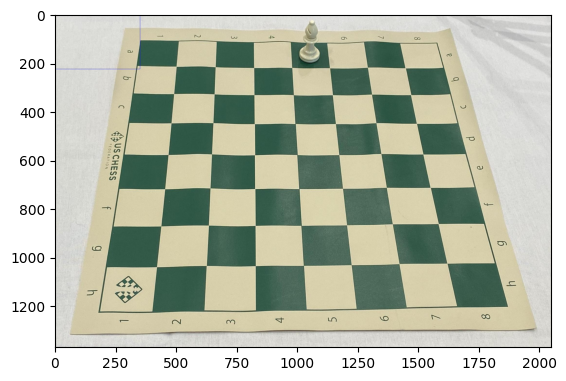

In [ ]:
boxes, scores, classes, nums = detect_objects(yolo_inf, image, white_list=CLASS_NAMES)

In [ ]:
#yolo.load_weights('fine_tuned_yolov3.weights.h5')

In [ ]:
for layer in yolo.layers:
    if 'yolo_output' or 'yolo_head' in layer.name:
        layer.trainable = True
    else:
        layer.trainable = False

In [ ]:
# Продолжим обучение с уменьшенным LR
yolo.compile(
    optimizer=tf.keras.optimizers.Adam(1e-4),  # Уменьшим LR
    loss=losses
)

# Перезапустите обучение
yolo.fit(
    train_gen,
    steps_per_epoch=len(train_images)//8,
    epochs=100,
    initial_epoch=44,  # Продолжить с 44 эпохи
    validation_data=valid_gen,
    validation_steps=len(valid_images)//8
)

Epoch 45/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 172s 4s/step - loss: 1640.4750 - yolo_output_1_loss: 33.1390 - yolo_output_2_loss: 238.7737 - yolo_output_3_loss: 1356.9841 - val_loss: 849.5561 - val_yolo_output_1_loss: 2.7329 - val_yolo_output_2_loss: 70.1766 - val_yolo_output_3_loss: 787.9067
Epoch 46/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 44s 2s/step - loss: 693.7729 - yolo_output_1_loss: 5.5089 - yolo_output_2_loss: 89.3475 - yolo_output_3_loss: 588.6565 - val_loss: 1025.1040 - val_yolo_output_1_loss: 1.4970 - val_yolo_output_2_loss: 50.8707 - val_yolo_output_3_loss: 962.7682
Epoch 47/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 45s 2s/step - loss: 470.9441 - yolo_output_1_loss: 3.0470 - yolo_output_2_loss: 58.5172 - yolo_output_3_loss: 399.4125 - val_loss: 14181.9951 - val_yolo_output_1_loss: 1.1935 - val_yolo_output_2_loss: 87.5931 - val_yolo_output_3_loss: 14083.2471
Epoch 48/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 43s 2s/step - loss: 380.9014 - yolo_output_1_loss: 3.2681 - yolo_output_2_loss: 44.3389 - yolo_output_3_

In [ ]:
yolo.save_weights('/content/drive/My Drive/Pyth/fine_tuned_heads_yolov3.weights.h5')

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!ls '/content/drive/My Drive/Pyth/'

fine_tuned_heads_yolov3.weights.h5


In [ ]:
YOLO_IOU_THRESHOLD = 0.1 # порог для оценок перекрытия IOU в NMS (параметр iou_threshold в tf.image.combined_non_max_suppression)
YOLO_SCORE_THRESHOLD = 0.1 # порог для оценок scores применяется в NMS (параметр score_threshold в tf.image.combined_non_max_suppression)

yolo_inf = YoloV3(classes=NUM_CLASSES)

In [ ]:
yolo_inf.load_weights('./drive/My Drive/Pyth/fine_tuned_heads_yolov3.weights.h5')

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


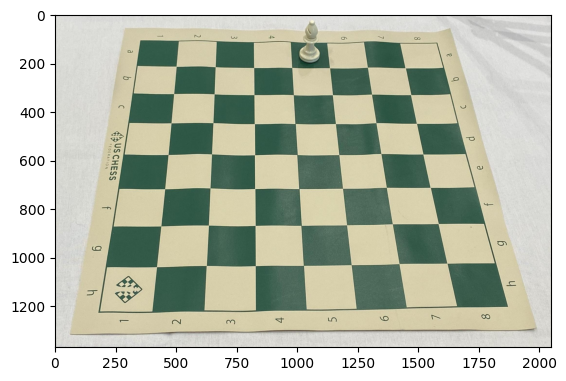

In [ ]:
boxes, scores, classes, nums = detect_objects(yolo_inf, image, white_list=CLASS_NAMES)

In [ ]:
yolo.compile(
    optimizer=tf.keras.optimizers.Adam(1e-4),  # Уменьшим LR
    loss=losses
)
yolo.load_weights('./drive/My Drive/Pyth/fine_tuned_heads_yolov3.weights.h5')

/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:802: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 446 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [ ]:
img = tf.image.decode_image(open(image, 'rb').read(), channels=3) # загружаем изображение как тензор

img = tf.expand_dims(img, 0) # добавляем размерность
img = preprocess_image(img, SIZE) # ресайзим изображение
raw_outputs = yolo_inf.predict(img)
print("Сырые выходы модели:")
for i, output in enumerate(raw_outputs):
    print(f"Output {i} shape: {output.shape}")
    print(f"Output {i} range: [{tf.reduce_min(output):.4f}, {tf.reduce_max(output):.4f}]")

    # Проверьте наличие ненулевых предсказаний
    nonzero_count = tf.reduce_sum(tf.cast(output != 0, tf.int32))
    print(f"Ненулевых элементов в output {i}: {nonzero_count.numpy()}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Сырые выходы модели:
Output 0 shape: (1, 100, 4)
Output 0 range: [0.0000, 0.0000]
Ненулевых элементов в output 0: 0
Output 1 shape: (1, 100)
Output 1 range: [0.0000, 0.0000]
Ненулевых элементов в output 1: 0
Output 2 shape: (1, 100)
Output 2 range: [0.0000, 0.0000]
Ненулевых элементов в output 2: 0
Output 3 shape: (1,)
Output 3 range: [0.0000, 0.0000]
Ненулевых элементов в output 3: 0


In [1]:
# Импорты
import os
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras import Model
from tensorflow.keras.layers import Add, Concatenate, Lambda
from tensorflow.keras.layers import Conv2D, Input, LeakyReLU
from tensorflow.keras.layers import UpSampling2D, ZeroPadding2D, BatchNormalization
from tensorflow.keras.regularizers import l2
from tensorflow.keras.losses import binary_crossentropy, sparse_categorical_crossentropy
from tensorflow.keras.optimizers import Adam
from itertools import repeat
import random
from sklearn.cluster import KMeans
import requests
from zipfile import ZipFile
from io import BytesIO
from PIL import Image

In [2]:
# Константы (адаптированы)
YOLO_IOU_THRESHOLD = 0.45  # Из Keras
YOLO_SCORE_THRESHOLD = 0.25  # Из Keras
IMAGE_SIZE = 416
MAX_BOXES_PER_IMAGE = 40  # Из Keras, можно уменьшить до 32 для экономии памяти
NUM_CLASSES = 12
BATCH_SIZE = 2  # Уменьшено для предотвращения OOM
SHUFFLE_BUFFER_SIZE = 512

In [3]:
# Mixed precision для снижения использования GPU
tf.keras.mixed_precision.set_global_policy('mixed_float16')

# Скачивание датасета
response = requests.get("https://public.roboflow.com/ds/nz8qgLBcbv?key=grwfQuh8d7")
zip_file = ZipFile(BytesIO(response.content))
zip_file.extractall("chess_dataset")

# Классы (без 'bishop')
CLASS_NAMES = [
    'black-bishop', 'black-king', 'black-knight', 'black-pawn', 'black-queen', 'black-rook',
    'white-bishop', 'white-king', 'white-knight', 'white-pawn', 'white-queen', 'white-rook'
]

In [4]:
# Функция IOU из Keras
def intersectionOverUnion_tf(boxes_preds, boxes_labels):
    box1_x1, box1_y1, box1_x2, box1_y2 = tf.split(boxes_preds, 4, axis=-1)
    box2_x1, box2_y1, box2_x2, box2_y2 = tf.split(boxes_labels, 4, axis=-1)

    x1 = tf.maximum(box1_x1, box2_x1)
    y1 = tf.maximum(box1_y1, box2_y1)
    x2 = tf.minimum(box1_x2, box2_x2)
    y2 = tf.minimum(box1_y2, box2_y2)

    intersection = tf.maximum(x2 - x1, 0) * tf.maximum(y2 - y1, 0)

    box1_area = tf.abs((box1_x2 - box1_x1) * (box1_y2 - box1_y1))
    box2_area = tf.abs((box2_x2 - box2_x1) * (box2_y2 - box2_y1))
    union = box1_area + box2_area - intersection

    iou = intersection / (union + tf.keras.backend.epsilon())
    return iou

In [6]:
# Функция Loss из Keras
def YoloLoss(anchors, classes=NUM_CLASSES, ignore_thresh=0.5):
    def yolo_loss(y_true, y_pred):
        def compute_loss_per_image(image_data):
            pred, true = image_data
            pred_box, pred_obj, pred_class, pred_xywh = yolo_boxes(pred, anchors, classes)
            pred_xy = pred_xywh[..., 0:2]
            pred_wh = pred_xywh[..., 2:4]

            true_box, true_obj, true_class_idx = tf.split(true, (4, 1, 1), axis=-1)
            true_xy = (true_box[..., 0:2] + true_box[..., 2:4]) / 2
            true_wh = true_box[..., 2:4] - true_box[..., 0:2]
            box_loss_scale = 2 - true_wh[..., 0] * true_wh[..., 1]

            grid_size = tf.shape(true)[0]
            grid = tf.meshgrid(tf.range(grid_size), tf.range(grid_size))
            grid = tf.expand_dims(tf.stack(grid, axis=-1), axis=2)
            true_xy = true_xy * tf.cast(grid_size, tf.float32) - tf.cast(grid, tf.float32)
            true_wh = tf.math.log(true_wh / anchors)
            true_wh = tf.where(tf.math.is_inf(true_wh), tf.zeros_like(true_wh), true_wh)

            obj_mask = tf.squeeze(true_obj, -1)
            true_box_flat = tf.boolean_mask(true_box, tf.cast(obj_mask, tf.bool))
            pred_box_flat = tf.reshape(pred_box, (-1, 4))
            num_true = tf.shape(true_box_flat)[0]

            ignore_mask = tf.cond(
                tf.equal(num_true, 0),
                lambda: tf.zeros(tf.shape(pred_box_flat)[0], dtype=tf.float32),
                lambda: tf.cast(
                    tf.reduce_max(
                        intersectionOverUnion_tf(pred_box_flat, true_box_flat),
                        axis=-1
                    ) < ignore_thresh,
                    tf.float32
                )
            )
            ignore_mask = tf.reshape(ignore_mask, tf.shape(obj_mask))

            xy_loss = obj_mask * box_loss_scale * tf.reduce_sum(tf.square(true_xy - pred_xy), axis=-1)
            wh_loss = obj_mask * box_loss_scale * tf.reduce_sum(tf.square(true_wh - pred_wh), axis=-1)

            obj_loss = binary_crossentropy(true_obj, pred_obj)
            obj_loss = obj_mask * obj_loss + (1 - obj_mask) * ignore_mask * obj_loss

            class_loss = obj_mask * sparse_categorical_crossentropy(true_class_idx, pred_class)

            xy_loss_sum = tf.reduce_sum(xy_loss)
            wh_loss_sum = tf.reduce_sum(wh_loss)
            obj_loss_sum = tf.reduce_sum(obj_loss)
            class_loss_sum = tf.reduce_sum(class_loss)

            return xy_loss_sum + wh_loss_sum + obj_loss_sum + class_loss_sum

        elems = (y_pred, y_true)
        per_image_losses = tf.vectorized_map(compute_loss_per_image, elems, fallback_to_while_loop=True)
        return tf.reduce_mean(per_image_losses)

    return yolo_loss

In [7]:
# Функция yolo_boxes
def yolo_boxes(pred, anchors, classes):
    grid_size = tf.shape(pred)[1]
    box_xy, box_wh, score, class_probs = tf.split(pred, (2, 2, 1, classes), axis=-1)
    box_xy = tf.sigmoid(box_xy)
    score = tf.sigmoid(score)
    class_probs = tf.sigmoid(class_probs)
    pred_box = tf.concat((box_xy, box_wh), axis=-1)

    grid = tf.meshgrid(tf.range(grid_size), tf.range(grid_size))
    grid = tf.expand_dims(tf.stack(grid, axis=-1), axis=2)
    b_xy = (box_xy + tf.cast(grid, tf.float32)) / tf.cast(grid_size, tf.float32)
    b_wh = tf.exp(box_wh) * anchors

    box_x1y1 = b_xy - b_wh / 2
    box_x2y2 = b_xy + b_wh / 2
    bbox = tf.concat([box_x1y1, box_x2y2], axis=-1)
    return bbox, score, class_probs, pred_box

In [8]:
# Функция NMS
@tf.function(jit_compile=False)
def nonMaximumSuppression(outputs, anchors, masks, classes):
    boxes, conf, out_type = [], [], []
    for output in outputs:
        boxes.append(tf.reshape(output[0], (tf.shape(output[0])[0], -1, tf.shape(output[0])[-1])))
        conf.append(tf.reshape(output[1], (tf.shape(output[1])[0], -1, tf.shape(output[1])[-1])))
        out_type.append(tf.reshape(output[2], (tf.shape(output[2])[0], -1, tf.shape(output[2])[-1])))
    bbox = tf.concat(boxes, axis=1)
    confidence = tf.concat(conf, axis=1)
    class_probs = tf.concat(out_type, axis=1)
    scores = confidence * class_probs
    boxes, scores, classes, valid_detections = tf.image.combined_non_max_suppression(
        boxes=tf.reshape(bbox, (tf.shape(bbox)[0], -1, 1, 4)),
        scores=tf.reshape(scores, (tf.shape(scores)[0], -1, tf.shape(scores)[-1])),
        max_output_size_per_class=100,
        max_total_size=100,
        iou_threshold=YOLO_IOU_THRESHOLD,
        score_threshold=YOLO_SCORE_THRESHOLD
    )
    return boxes, scores, classes, valid_detections

In [9]:
# Обновлённая функция load_image_and_annotations (добавлена конвертация путей в str)
def load_image_and_annotations(img_path, lbl_path):
    img_path = str(img_path)
    lbl_path = str(lbl_path)
    image = tf.io.read_file(img_path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.cast(image, tf.float32) / 255.0

    annotations_list = []
    if tf.io.gfile.exists(lbl_path):
        lines = tf.io.read_file(lbl_path).numpy().decode('utf-8').splitlines()
        for line in lines:
            if line.strip():
                cls, x, y, w, h = map(float, line.split())
                cls_int = int(cls)
                if cls_int == 0:  # Игнор 'bishop'
                    continue
                cls_int -= 1  # Сдвиг классов
                annotations_list.append([x - w/2, y - h/2, x + w/2, y + h/2, cls_int])
    if annotations_list:
        annotations = tf.constant(annotations_list, dtype=tf.float32)
    else:
        annotations = tf.zeros((0, 5), dtype=tf.float32)
    return image, annotations

In [10]:
# Аугментация
def augment_data(image, annotations):
    if random.random() < 0.5:
        image = tf.image.flip_left_right(image)
        annotations = tf.concat([1.0 - annotations[..., 0:1], annotations[..., 1:2],
                                 1.0 - annotations[..., 2:3], annotations[..., 3:]], axis=-1)
    if random.random() < 0.5:
        image = tf.image.random_brightness(image, 0.2)
    if random.random() < 0.5:
        image = tf.image.random_contrast(image, 0.8, 1.2)
    return image, annotations

In [11]:
# Паддинг
def pad_annotations(image, annotations):
    num_annotations = tf.shape(annotations)[0]
    annotations_cropped = annotations[:MAX_BOXES_PER_IMAGE, :]
    num_after_crop = tf.shape(annotations_cropped)[0]
    padding_size = tf.maximum(0, MAX_BOXES_PER_IMAGE - num_after_crop)
    padding = tf.zeros((padding_size, 5), dtype=tf.float32)
    annotations_padded = tf.concat([annotations_cropped, padding], axis=0)
    return image, annotations_padded

In [12]:
# Трансформация таргетов для вывода (с while_loop для graph)
@tf.function(jit_compile=False)
def transform_targets_for_output(y_true, grid_size, anchor_idxs, classes):
    N = tf.shape(y_true)[0]
    y_true_out = tf.zeros((N, grid_size, grid_size, tf.shape(anchor_idxs)[0], 6))

    anchor_idxs = tf.cast(anchor_idxs, tf.int32)
    indexes = tf.TensorArray(tf.int32, size=0, dynamic_size=True, element_shape=[4])
    updates = tf.TensorArray(tf.float32, size=0, dynamic_size=True, element_shape=[6])
    idx = tf.constant(0, dtype=tf.int32)

    def body_i(i, idx, indexes, updates):
        def body_j(j, idx, indexes, updates):
            cond = tf.reduce_all(tf.equal(y_true[i, j, 0:4], 0))
            def true_fn():
                return j + 1, idx, indexes, updates
            def false_fn():
                anchor_eq = tf.equal(anchor_idxs, tf.cast(y_true[i, j, 5], tf.int32))
                cond_anchor = tf.reduce_any(anchor_eq)
                def true_anchor():
                    box = y_true[i, j, 0:4]
                    box_xy = (y_true[i, j, 0:2] + y_true[i, j, 2:4]) / 2
                    anchor_idx = tf.cast(tf.where(anchor_eq), tf.int32)[0, 0]
                    grid_xy = tf.cast(box_xy // (1.0 / tf.cast(grid_size, tf.float32)), tf.int32)
                    new_indexes = indexes.write(idx, [i, grid_xy[1], grid_xy[0], anchor_idx])
                    new_updates = updates.write(idx, [box[0], box[1], box[2], box[3], 1.0, y_true[i, j, 4]])
                    return j + 1, idx + 1, new_indexes, new_updates
                def false_anchor():
                    return j + 1, idx, indexes, updates
                return tf.cond(cond_anchor, true_anchor, false_anchor)
            return tf.cond(cond, true_fn, false_fn)

        j, idx, indexes, updates = tf.while_loop(
            lambda j, idx, indexes, updates: j < tf.shape(y_true)[1],
            body_j,
            [tf.constant(0, tf.int32), idx, indexes, updates],
            shape_invariants=[tf.TensorShape([]), tf.TensorShape([]), None, None]
        )
        return i + 1, idx, indexes, updates

    _, idx, indexes, updates = tf.while_loop(
        lambda i, idx, indexes, updates: i < N,
        body_i,
        [tf.constant(0, tf.int32), idx, indexes, updates],
        shape_invariants=[tf.TensorShape([]), tf.TensorShape([]), None, None]
    )

    return tf.tensor_scatter_nd_update(y_true_out, indexes.stack(), updates.stack())

In [13]:
# Трансформация таргетов
def transform_targets(y_train, anchors, anchor_masks, classes):
    outputs = []
    grid_size = IMAGE_SIZE // 32
    anchors = tf.cast(anchors, tf.float32)
    anchor_area = anchors[..., 0] * anchors[..., 1]

    batch_size = tf.shape(y_train)[0]
    max_objects = tf.shape(y_train)[1]

    y_train_reshaped = tf.reshape(y_train, (batch_size * max_objects, 5))
    box_wh = y_train_reshaped[..., 2:4] - y_train_reshaped[..., 0:2]
    box_area = box_wh[..., 0] * box_wh[..., 1]

    best_iou = tf.zeros((batch_size * max_objects,))
    best_anchor_idx = tf.zeros((batch_size * max_objects,), dtype=tf.int32)

    num_anchors = tf.shape(anchors)[0]
    i = tf.constant(0, dtype=tf.int32)
    def cond(i, *args):
        return i < num_anchors
    def body(i, best_iou, best_anchor_idx):
        anchor = anchors[i]
        anchor_w, anchor_h = anchor[0], anchor[1]
        inter_w = tf.minimum(box_wh[..., 0], anchor_w)
        inter_h = tf.minimum(box_wh[..., 1], anchor_h)
        intersection = inter_w * inter_h
        anchor_area_expanded = anchor_w * anchor_h
        union = box_area + anchor_area_expanded - intersection
        iou = intersection / (union + 1e-8)
        better_mask = iou > best_iou
        best_iou = tf.where(better_mask, iou, best_iou)
        best_anchor_idx = tf.where(better_mask, i, best_anchor_idx)
        return i + 1, best_iou, best_anchor_idx
    _, best_iou, best_anchor_idx = tf.while_loop(cond, body, [i, best_iou, best_anchor_idx])

    anchor_idx = tf.cast(best_anchor_idx, tf.float32)
    anchor_idx = tf.reshape(anchor_idx, (batch_size, max_objects, 1))
    y_train = tf.concat([y_train, anchor_idx], axis=-1)

    for k in range(len(anchor_masks)):
        anchor_idxs = tf.constant(anchor_masks[k], dtype=tf.int32)
        output = tf.map_fn(
            lambda x: transform_targets_for_output(tf.expand_dims(x, 0), grid_size, anchor_idxs, classes),
            y_train,
            fn_output_signature=tf.TensorSpec(shape=(1, grid_size, grid_size, 3, 6), dtype=tf.float32)
        )
        outputs.append(tf.squeeze(output, axis=1))
        grid_size *= 2

    return tuple(outputs)

In [14]:
# Обновлённая функция create_dataset (корректные пути с 'chess_yolo' и subfolders)
def create_dataset(split, batch_size, is_training_set=True):
    base_dir = 'chess_dataset/chess_yolo'
    img_dir = os.path.join(base_dir, split, 'images')
    lbl_dir = os.path.join(base_dir, split, 'labels')
    img_paths = tf.io.gfile.glob(os.path.join(img_dir, '*.jpg'))
    lbl_paths = [os.path.join(lbl_dir, os.path.basename(p).replace('.jpg', '.txt')) for p in img_paths]
    valid_pairs = [(img, lbl) for img, lbl in zip(img_paths, lbl_paths) if tf.io.gfile.exists(img) and tf.io.gfile.exists(lbl)]
    if not valid_pairs:
        return None

    dataset = tf.data.Dataset.from_tensor_slices(valid_pairs)
    if is_training_set:
        dataset = dataset.shuffle(SHUFFLE_BUFFER_SIZE)

    dataset = dataset.map(lambda paths: tf.py_function(load_image_and_annotations, [paths[0], paths[1]], [tf.float32, tf.float32]), num_parallel_calls=tf.data.AUTOTUNE)

    dataset = dataset.map(lambda img, ann: (tf.ensure_shape(img, [None, None, 3]), tf.ensure_shape(ann, [None, 5])), num_parallel_calls=tf.data.AUTOTUNE)

    if is_training_set:
        dataset = dataset.map(augment_data, num_parallel_calls=tf.data.AUTOTUNE)
    else:
        dataset = dataset.map(lambda img, ann: (tf.ensure_shape(tf.image.resize(img, [IMAGE_SIZE, IMAGE_SIZE]), [IMAGE_SIZE, IMAGE_SIZE, 3]), ann), num_parallel_calls=tf.data.AUTOTUNE)

    dataset = dataset.map(pad_annotations, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.batch(batch_size, drop_remainder=is_training_set)
    dataset = dataset.map(lambda imgs, anns: (imgs, transform_targets(anns, yolo_anchors, yolo_anchor_masks, NUM_CLASSES)), num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.prefetch(tf.data.AUTOTUNE)
    return dataset

In [15]:
# Обновлённый compute_anchors (корректные пути)
train_img_dir = 'chess_dataset/chess_yolo/train/images'
train_lbl_dir = 'chess_dataset/chess_yolo/train/labels'
train_bboxes = []
for img_file in os.listdir(train_img_dir):
    if img_file.endswith('.jpg'):
        lbl_path = os.path.join(train_lbl_dir, img_file.replace('.jpg', '.txt'))
        if os.path.exists(lbl_path):
            with open(lbl_path, 'r') as f:
                lines = f.readlines()
            bboxes = []
            for line in lines:
                cls, x, y, w, h = map(float, line.strip().split())
                if int(cls) == 0: continue
                bboxes.append([x - w/2, y - h/2, x + w/2, y + h/2])
            if bboxes:
                train_bboxes.append(np.array(bboxes))

new_anchors = compute_anchors(train_bboxes) * IMAGE_SIZE
yolo_anchors = np.array(new_anchors, dtype=np.float32).reshape(9, 2)
yolo_anchor_masks = np.array([[6,7,8], [3,4,5], [0,1,2]])

In [17]:
# Загрузка для anchors
train_img_dir = 'chess_dataset/train'
train_lbl_dir = 'chess_dataset/train'
train_bboxes = []
for img_file in os.listdir(train_img_dir):
    if img_file.endswith('.jpg'):
        lbl_path = os.path.join(train_lbl_dir, img_file.replace('.jpg', '.txt'))
        if os.path.exists(lbl_path):
            with open(lbl_path, 'r') as f:
                lines = f.readlines()
            bboxes = []
            for line in lines:
                cls, x, y, w, h = map(float, line.strip().split())
                if int(cls) == 0: continue
                bboxes.append([x - w/2, y - h/2, x + w/2, y + h/2])
            if bboxes:
                train_bboxes.append(np.array(bboxes))

new_anchors = compute_anchors(train_bboxes) * IMAGE_SIZE
yolo_anchors = np.array(new_anchors, dtype=np.float32).reshape(9, 2)
yolo_anchor_masks = np.array([[6,7,8], [3,4,5], [0,1,2]])

In [18]:
# Создание датасетов (обновлённый вызов)
train_dataset = create_dataset('train', BATCH_SIZE, True)
valid_dataset = create_dataset('valid', BATCH_SIZE, False)

ValueError: in user code:

    File "/tmp/ipython-input-2677850930.py", line 18, in None  *
        lambda img, ann: (tf.image.resize(img, [IMAGE_SIZE, IMAGE_SIZE]), ann)

    ValueError: 'images' contains no shape.


In [ ]:
def DBL(x, filters, kernel, strides=1, batch_norm=True):
    if strides == 1:
        padding = 'same'
    else:
        # Делаем oтступ в виде нулей по контуру изображения, что бы захватить левый верхний угол
        x = ZeroPadding2D(((1, 0), (1, 0)))(x)
        padding = 'valid'
    x = Conv2D(filters=filters, kernel_size=kernel,
              strides=strides, padding=padding,
              use_bias=not batch_norm,  # используем смещение, если нет нормализации
              kernel_regularizer=l2(0.0005))(x)
    if batch_norm:
        x = BatchNormalization(epsilon=0.001)(x)
        x = LeakyReLU(negative_slope=0.1)(x)
    return x



In [ ]:
def ResUnit(x, filters):
    skip_connection  = x
    x = DBL(x, filters // 2, 1)
    x = DBL(x, filters, 3)
    x = Add()([skip_connection , x])
    return x

In [ ]:
def ResN(x, filters, blocks):
    x = DBL(x, filters, kernel=3, strides=2)
    for _ in repeat(None, blocks): # цикл по n-блокам (подход с repeat позволяет экономить память)
        x = ResUnit(x, filters)
    return x

In [ ]:
def Darknet(name=None):
    x = inputs = Input([None, None, 3])
    x = DBL(x, 32, 3)
    x = ResN(x, 64, 1)
    x = ResN(x, 128, 2)
    x = Route_1 = ResN(x, 256, 8)
    x = Route_2 = ResN(x, 512, 8)
    Route_3 = ResN(x, 1024, 4)
    return tf.keras.Model(inputs, (Route_1, Route_2, Route_3), name=name)

In [ ]:
def YoloHead(filters, name=None):
    def layer(x_in):
        if isinstance(x_in, tuple): #
            inputs = Input(x_in[0].shape[1:]), Input(x_in[1].shape[1:])
            x, x_skip = inputs

            x = DBL(x, filters, 1)
            x = UpSampling2D(2)(x)
            x = Concatenate()([x, x_skip])
        else:
            x = inputs = Input(x_in.shape[1:])

        x = DBL(x, filters, 1)
        x = DBL(x, filters * 2, 3)
        x = DBL(x, filters, 1)
        x = DBL(x, filters * 2, 3)
        x = DBL(x, filters, 1)
        return Model(inputs, x, name=name)(x_in)
    return layer

def YoloHeadOutput(filters, anchors, classes, name=None):
    def layer(x_in):

        x = inputs = Input(x_in.shape[1:])
        x = DBL(x, filters * 2, 3)
        x = DBL(x, anchors * (classes + 5), 1, batch_norm=False)
        x = Lambda(lambda x: tf.reshape(x, (-1, tf.shape(x)[1], tf.shape(x)[2],
                                        anchors, classes + 5)))(x)
        return tf.keras.Model(inputs, x, name=name)(x_in)
    return layer

In [ ]:
def YoloV3(size=None, channels=3, anchors=yolo_anchors,
            masks=yolo_anchor_masks, classes=NUM_CLASSES, training=False):
    # Вход
    x = inputs = Input([size, size, channels])

    # Модель Darknet с тремя выходами
    Route_1, Route_2, Route_3 = Darknet(name='yolo_darknet')(x)

    # Определяем 3 головы с разным числом фильтров
    x = YoloHead(512, name='yolo_head_1')(Route_3)
    output_0 = YoloHeadOutput(512, len(masks[0]), classes, name='yolo_output_1')(x)

    x = YoloHead(256, name='yolo_head_2')((x, Route_2))
    output_1 = YoloHeadOutput(256, len(masks[1]), classes, name='yolo_output_2')(x)

    x = YoloHead(128, name='yolo_head_3')((x, Route_1))
    output_2 = YoloHeadOutput(128, len(masks[2]), classes, name='yolo_output_3')(x)

    if training: # заложим модель для обучения (понадобиться в домашней работе)
        return Model(inputs, (output_0, output_1, output_2), name='yolov3')

    # Перегоняем предсказанные якорные рамки в boundary box для трех выходов
    boxes_0 = Lambda(lambda x: yolo_boxes(x, anchors[masks[0]], classes),
                  name='yolo_boxes_0')(output_0)
    boxes_1 = Lambda(lambda x: yolo_boxes(x, anchors[masks[1]], classes),
                  name='yolo_boxes_1')(output_1)
    boxes_2 = Lambda(lambda x: yolo_boxes(x, anchors[masks[2]], classes),
                  name='yolo_boxes_2')(output_2)

    # Отсекаем все лишнее алгоритмом NMS
    outputs = Lambda(lambda x: nonMaximumSuppression(x, anchors, masks, classes),
                  name='nonMaximumSuppression')((boxes_0[:3], boxes_1[:3], boxes_2[:3]))

    return Model(inputs, outputs, name='yolov3') # возвращаем модель для инференса

In [ ]:
yolo = YoloV3(classes=NUM_CLASSES, training=True)

In [ ]:
def load_darknet_weights(model, weights_file):

    wf = open(weights_file, 'rb') # загружаем файл

    # Читаем из файла по элементам (первые 5, версия файла)
    major, minor, revision, seen, _ = np.fromfile(wf, dtype=np.int32, count=5)
    layers = YOLO_V3_LAYERS # слои для загрузки

    for layer_name in layers:
        sub_model = model.get_layer(layer_name)      # извлекаем блоки слоев из модели по имени
        for i, layer in enumerate(sub_model.layers): # пробегаемся по отдельным слоям блоков
            if not layer.name.startswith('conv2d'):  # пропускаем не сверточные слои
                continue
            batch_norm = None
            if i + 1 < len(sub_model.layers) and \
                sub_model.layers[i + 1].name.startswith('batch_norm'):
                    batch_norm = sub_model.layers[i + 1]  # фиксируем если за слоем будет батч-нормализация



            filters = layer.filters                   # фильтров в слое
            size = layer.kernel_size[0]               # размер ядра в слое
            #in_dim = layer.input_shape[-1]           # input_shape в слоях Conv2d больше не поддерживается
            in_dim = layer.get_weights()[0].shape[2]  # входная размерность слоя

            # Вспоминаем структуру DBL: если нет нормализации, то добавляется смещение
            if batch_norm is None:
                conv_bias = np.fromfile(wf, dtype=np.float32, count=filters) # считываем веса для смещения
            else:
                bn_weights = np.fromfile(wf, dtype=np.float32, count=4*filters) # считываем веса для нормализации
                bn_weights = bn_weights.reshape((4, filters))[[1, 0, 2, 3]]     # меняем форму

            conv_shape = (filters, in_dim, size, size)    # размерности сверточного слоя
            conv_weights = np.fromfile(wf, dtype=np.float32, count=np.prod(conv_shape))  # считываем веса для сверточного слоя
            conv_weights = conv_weights.reshape(conv_shape).transpose([2, 3, 1, 0]) # меняем форму данных весов, решейпим и транспонируем

            # Если нет нормализации, то добавляем веса + смещение
            if batch_norm is None:
                layer.set_weights([conv_weights, conv_bias])
            else:
                # Если есть нормализации, то добавляем веса в сверточный слой и в следующий за ним слой нормализации
                layer.set_weights([conv_weights])
                batch_norm.set_weights(bn_weights)

    wf.close()

In [ ]:
# Загрузка весов (как в вашем)
!wget https://storage.yandexcloud.net/academy.ai/CV/yolov3.weights
load_darknet_weights(yolo, 'yolov3.weights')
yolo.save_weights('yolov3.weights.h5')

In [ ]:
# Заморозка backbone
for layer in yolo.layers:
    if 'yolo_head' in layer.name or 'yolo_output' in layer.name:
        layer.trainable = True
    else:
        layer.trainable = False



# Функции detect_objects и draw_outputs (как в вашем, без изменений)

In [ ]:
# Компиляция и обучение
losses = [YoloLoss(yolo_anchors[m], NUM_CLASSES) for m in yolo_anchor_masks]
optimizer = Adam(learning_rate=1e-4)
yolo.compile(optimizer=optimizer, loss=losses)
history = yolo.fit(train_dataset, epochs=50, validation_data=valid_dataset)

In [ ]:
# Функции для инференса (как в вашем)
def draw_outputs(img, outputs, class_names, white_list=None):
    boxes, score, classes, nums = outputs
    boxes, score, classes, nums = boxes[0], score[0], classes[0], nums[0]
    wh = np.flip(img.shape[0:2])
    for i in range(nums):
        if class_names[int(classes[i])] not in white_list:
            continue
        x1y1 = tuple((np.array(boxes[i][0:2]) * wh).astype(np.int32))
        x2y2 = tuple((np.array(boxes[i][2:4]) * wh).astype(np.int32))
        img = cv2.rectangle(img, x1y1, x2y2, (255, 0, 0), 1)
        img = cv2.putText(img, '{} {:.2f}'.format(class_names[int(classes[i])], score[i]),
                          x1y1, cv2.FONT_HERSHEY_COMPLEX_SMALL, 1, (0, 0, 0), 1)
    return img

def detect_objects(model, img_path, white_list=None):
    image = img_path
    img = tf.image.decode_image(open(image, 'rb').read(), channels=3)
    img = tf.expand_dims(img, 0)
    original_shape = img.shape[:2]
    img = tf.image.resize(img, (IMAGE_SIZE, IMAGE_SIZE)) / 255.0
    boxes, scores, classes, nums = model.predict(img)
    img = cv2.imread(image)
    wh = np.array(original_shape)[::-1]
    img = draw_outputs(img, (boxes, scores, classes, nums), CLASS_NAMES, white_list)
    base_name = os.path.basename(img_path)
    output_filename = 'detected_' + base_name
    output_path = os.path.join(os.path.dirname(img_path), output_filename)
    cv2.imwrite(output_path, img)
    detected = Image.open(output_path)
    detected.show()
    return boxes, scores, classes, nums

# Обновление

In [39]:
import os
os.environ['TF_XLA_FLAGS'] = '--tf_xla_auto_jit=0'
import cv2
import matplotlib.pyplot as plt
import numpy as np
import yaml
import glob
import random
import time

from IPython.display import Image as IPImage, display
from io import BytesIO

import tensorflow as tf
from tensorflow.keras import Model
from tensorflow.keras.layers import Add, Concatenate, Lambda
from tensorflow.keras.layers import Conv2D, Input, LeakyReLU
from tensorflow.keras.layers import UpSampling2D, ZeroPadding2D, BatchNormalization
from tensorflow.keras.regularizers import l2
from tensorflow.keras.losses import binary_crossentropy
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, TensorBoard, ReduceLROnPlateau, EarlyStopping

from itertools import repeat

import warnings
warnings.filterwarnings('ignore')

print(f"TensorFlow версия: {tf.__version__}")
print("Все необходимые модули импортированы.")
tf.config.optimizer.set_jit(False)
print("XAI JIT compilation explicitly disabled via tf.config.optimizer.set_jit(False)")
print(f"Current JIT config: {tf.config.optimizer.get_jit()}")

TensorFlow версия: 2.19.0
Все необходимые модули импортированы.
XAI JIT compilation explicitly disabled via tf.config.optimizer.set_jit(False)
Current JIT config: 


In [2]:
!wget https://storage.yandexcloud.net/academy.ai/CV/chess_yolo.zip -O chess_yolo.zip
!unzip -qo "chess_yolo.zip" -d ./chess_dataset
!ls ./chess_dataset/chess_yolo

dataset_base_dir = './chess_dataset'
yolo_data_dir = os.path.join(dataset_base_dir, 'chess_yolo')

original_yaml_path = os.path.join(yolo_data_dir, 'data.yaml')
custom_yaml_path = os.path.join(yolo_data_dir, 'custom_data_for_keras.yaml')

--2025-10-14 12:45:39--  https://storage.yandexcloud.net/academy.ai/CV/chess_yolo.zip
Resolving storage.yandexcloud.net (storage.yandexcloud.net)... 213.180.193.243, 2a02:6b8::1d9
Connecting to storage.yandexcloud.net (storage.yandexcloud.net)|213.180.193.243|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 39275734 (37M) [application/x-zip-compressed]
Saving to: ‘chess_yolo.zip’

chess_yolo.zip      100%[===================>]  37.46M  12.8MB/s    in 2.9s    

2025-10-14 12:45:43 (12.8 MB/s) - ‘chess_yolo.zip’ saved [39275734/39275734]

data.yaml	    README.roboflow.txt  train	video.mp4
README.dataset.txt  test		 valid


In [3]:
NUM_CLASSES = 0
CLASS_NAMES = []

with open(original_yaml_path, 'r') as f:
    data_yaml_content = yaml.safe_load(f)

print("\nСодержимое оригинального data.yaml:")
print(yaml.dump(data_yaml_content, allow_unicode=True,))


Содержимое оригинального data.yaml:
names:
  0: слон
  1: черный слон
  2: черный король
  3: черный конь
  4: черная пешка
  5: черный ферзь
  6: черная ладья
  7: белый слон
  8: белый король
  9: белый конь
  10: белая пешка
  11: белый ферзь
  12: белая ладья
path: ../chess_yolo
test: test/images
train: train/images
val: valid/images



In [4]:
CLASS_NAMES = data_yaml_content['names']
print(f"Имена классов (names): {CLASS_NAMES}")

NUM_CLASSES = len(CLASS_NAMES)
print(f"Количество классов ('nc') будет определено по длине списка 'names': {NUM_CLASSES}")

Имена классов (names): {0: 'слон', 1: 'черный слон', 2: 'черный король', 3: 'черный конь', 4: 'черная пешка', 5: 'черный ферзь', 6: 'черная ладья', 7: 'белый слон', 8: 'белый король', 9: 'белый конь', 10: 'белая пешка', 11: 'белый ферзь', 12: 'белая ладья'}
Количество классов ('nc') будет определено по длине списка 'names': 13


In [5]:
path_from_yaml = data_yaml_content.get('path', None)
if path_from_yaml:
    if os.path.isabs(path_from_yaml):
        base_path_for_yaml_processing = path_from_yaml
    else:
        base_path_for_yaml_processing = os.path.abspath(os.path.join(os.path.dirname(original_yaml_path), path_from_yaml))
else:
    base_path_for_yaml_processing = os.path.abspath(os.path.dirname(original_yaml_path))

train_key_in_yaml = 'train'
val_key_in_yaml = 'val'

train_path_from_yaml = data_yaml_content[train_key_in_yaml]
val_path_from_yaml = data_yaml_content[val_key_in_yaml]

TRAIN_IMG_DIR = os.path.abspath(os.path.join(base_path_for_yaml_processing, train_path_from_yaml))
VAL_IMG_DIR = os.path.abspath(os.path.join(base_path_for_yaml_processing, val_path_from_yaml))

TRAIN_LBL_DIR = TRAIN_IMG_DIR.replace(os.path.sep + 'images', os.path.sep + 'labels')
VAL_LBL_DIR = VAL_IMG_DIR.replace(os.path.sep + 'images', os.path.sep + 'labels')

current_img_dir_name = os.path.basename(TRAIN_IMG_DIR)
parent_of_img_dir_train = os.path.dirname(TRAIN_IMG_DIR)
if current_img_dir_name == 'images':
     TRAIN_LBL_DIR = os.path.join(parent_of_img_dir_train, 'labels')

current_img_dir_name_val = os.path.basename(VAL_IMG_DIR)
parent_of_img_dir_val = os.path.dirname(VAL_IMG_DIR)
if current_img_dir_name_val == 'images':
     VAL_LBL_DIR = os.path.join(parent_of_img_dir_val, 'labels')

custom_yaml_content_display = {
    'train_images_path': TRAIN_IMG_DIR,
    'train_labels_path': TRAIN_LBL_DIR,
    'val_images_path': VAL_IMG_DIR,
    'val_labels_path': VAL_LBL_DIR,
    'nc': NUM_CLASSES,
    'names': CLASS_NAMES
}

with open(custom_yaml_path, 'w') as f:
    yaml.dump(custom_yaml_content_display, f, sort_keys=False, default_flow_style=False)

print(f"\nКонфигурация для Keras (сохранена в {custom_yaml_path}):")
print(yaml.dump(custom_yaml_content_display, allow_unicode=True, sort_keys=False, default_flow_style=False))

print("\nПроверка ключевых директорий датасета:")
for p_name, p_val in [("Train Img", TRAIN_IMG_DIR), ("Train Lbl", TRAIN_LBL_DIR),
                      ("Val Img", VAL_IMG_DIR), ("Val Lbl", VAL_LBL_DIR)]:
    print(f"Директория {p_name} ({p_val}) - OK")


Конфигурация для Keras (сохранена в ./chess_dataset/chess_yolo/custom_data_for_keras.yaml):
train_images_path: /content/chess_dataset/chess_yolo/train/images
train_labels_path: /content/chess_dataset/chess_yolo/train/labels
val_images_path: /content/chess_dataset/chess_yolo/valid/images
val_labels_path: /content/chess_dataset/chess_yolo/valid/labels
nc: 13
names:
  0: слон
  1: черный слон
  2: черный король
  3: черный конь
  4: черная пешка
  5: черный ферзь
  6: черная ладья
  7: белый слон
  8: белый король
  9: белый конь
  10: белая пешка
  11: белый ферзь
  12: белая ладья


Проверка ключевых директорий датасета:
Директория Train Img (/content/chess_dataset/chess_yolo/train/images) - OK
Директория Train Lbl (/content/chess_dataset/chess_yolo/train/labels) - OK
Директория Val Img (/content/chess_dataset/chess_yolo/valid/images) - OK
Директория Val Lbl (/content/chess_dataset/chess_yolo/valid/labels) - OK


In [6]:
IMAGE_SIZE = 416
yolo_anchors_original_scale = np.array([
    (10, 13), (16, 30), (33, 23), (30, 61), (62, 45),
    (59, 119), (116, 90), (156, 198), (373, 326)
], np.float32)
yolo_anchors = yolo_anchors_original_scale / IMAGE_SIZE
yolo_anchor_masks = np.array([[6, 7, 8], [3, 4, 5], [0, 1, 2]])

In [7]:
def calculate_anchors():
    from sklearn.cluster import KMeans
    widths = []
    heights = []
    label_files = glob.glob(os.path.join(TRAIN_LBL_DIR, '*.txt'))

    for label_file in label_files:
        with open(label_file, 'r') as f:
            for line in f:
                parts = line.strip().split()
                if not parts:
                    continue

                try:
                    # Если 5 элементов - обычный bbox формат
                    if len(parts) == 5:
                        class_id, x_center, y_center, w, h = map(float, parts)
                        widths.append(w * IMAGE_SIZE)
                        heights.append(h * IMAGE_SIZE)

                    # Если больше 5 элементов - это полигон, конвертируем в bbox
                    elif len(parts) > 5:
                        class_id = float(parts[0])
                        coordinates = list(map(float, parts[1:]))

                        # Извлекаем все X и Y координаты
                        x_coords = coordinates[0::2]  # все четные индексы
                        y_coords = coordinates[1::2]  # все нечетные индексы

                        # Находим границы bounding box
                        x_min = min(x_coords)
                        x_max = max(x_coords)
                        y_min = min(y_coords)
                        y_max = max(y_coords)

                        # Вычисляем ширину и высоту
                        w = x_max - x_min
                        h = y_max - y_min

                        widths.append(w * IMAGE_SIZE)
                        heights.append(h * IMAGE_SIZE)

                    else:
                        print(f"⚠️  Неизвестный формат в файле {label_file}: {line.strip()}")

                except Exception as e:
                    print(f"❌ Ошибка в файле {label_file}, строка: {line.strip()}")
                    print(f"   Ошибка: {e}")
                    continue

    if not widths:
        print("❌ Не найдено корректных данных для расчета анкоров!")
        return

    print(f"✅ Обработано bounding boxes: {len(widths)}")

    boxes = np.column_stack((widths, heights))
    kmeans = KMeans(n_clusters=9, random_state=0).fit(boxes)
    new_anchors = kmeans.cluster_centers_

    # Округляем до целых значений и сортируем по ширине
    new_anchors = np.round(new_anchors).astype(int)
    new_anchors = new_anchors[np.argsort(new_anchors[:, 0])]

    global yolo_anchors_original_scale
    global yolo_anchors
    yolo_anchors_original_scale = new_anchors
    yolo_anchors = yolo_anchors_original_scale / IMAGE_SIZE
    print("🔷 Recalculated anchors (целые значения):", yolo_anchors_original_scale)

In [8]:
calculate_anchors()

✅ Обработано bounding boxes: 6324
🔷 Recalculated anchors (целые значения): [[20 42]
 [23 47]
 [23 31]
 [25 58]
 [26 52]
 [31 71]
 [31 62]
 [31 80]
 [37 90]]


In [9]:
def create_scale_pyramid_anchors(base_anchors=None, scales=[0.75, 1.0, 1.25]):
    """
    Создает пирамиду анкоров разных масштабов на основе базовых
    """
    if base_anchors is None:
        base_anchors = np.array([
            [21, 43], [23, 48], [23, 32], [25, 59], [27, 53],
            [31, 62], [31, 73], [32, 83], [38, 91]
        ])

    scaled_anchors = []
    for scale in scales:
        scaled = base_anchors * scale
        scaled = np.round(scaled).astype(int)
        scaled = np.maximum(scaled, 1)  # минимум 1 пиксель
        scaled_anchors.append(scaled)

    # Объединяем все масштабы
    pyramid_anchors = np.vstack(scaled_anchors)

    # Кластеризуем обратно в 9 анкоров для сохранения структуры YOLO
    from sklearn.cluster import KMeans
    kmeans = KMeans(n_clusters=9, random_state=42)
    kmeans.fit(pyramid_anchors)

    final_anchors = kmeans.cluster_centers_
    final_anchors = np.round(final_anchors).astype(int)
    final_anchors = final_anchors[np.argsort(final_anchors[:, 0])]
    yolo_anchors_original_scale = final_anchors
    yolo_anchors = yolo_anchors_original_scale / IMAGE_SIZE

    print(f"Масштабы:\n {scales}\n")
    print(f"Итоговые анкоры:\n {final_anchors}")

create_scale_pyramid_anchors()

Масштабы:
 [0.75, 1.0, 1.25]

Итоговые анкоры:
 [[ 18  31]
 [ 20  42]
 [ 23  47]
 [ 26  58]
 [ 29  40]
 [ 31  70]
 [ 36  80]
 [ 38  91]
 [ 44 109]]


In [10]:
def DBL(x, filters, kernel, strides=1, batch_norm=True, name_prefix=''):
    if strides == 1:
        padding = 'same'
    else:
        x = ZeroPadding2D(((1, 0), (1, 0)), name=f'{name_prefix}_zeropad')(x)
        padding = 'valid'
    x = Conv2D(filters=filters, kernel_size=kernel,
               strides=strides, padding=padding,
               use_bias=not batch_norm,
               kernel_regularizer=l2(0.0005), name=f'{name_prefix}_conv2d')(x)
    if batch_norm:
        x = BatchNormalization(epsilon=0.001, name=f'{name_prefix}_bn')(x)
        x = LeakyReLU(alpha=0.1, name=f'{name_prefix}_leakyrelu')(x)
    return x

def ResUnit(x, filters, name_prefix=''):
    skip_connection = x
    x = DBL(x, filters // 2, 1, name_prefix=f'{name_prefix}_dbl1')
    x = DBL(x, filters, 3, name_prefix=f'{name_prefix}_dbl2')
    x = Add(name=f'{name_prefix}_add')([skip_connection, x])
    return x

def ResN(x, filters, blocks, name_prefix=''):
    x = DBL(x, filters, kernel=3, strides=2, name_prefix=f'{name_prefix}_dbl_downsample')
    for i in range(blocks):
        x = ResUnit(x, filters, name_prefix=f'{name_prefix}_resunit{i+1}')
    return x

def Darknet(name='yolo_darknet'):
    x = inputs = Input([None, None, 3], name='darknet_input')
    x = DBL(x, 32, 3, name_prefix='darknet_dbl_1')
    x = ResN(x, 64, 1, name_prefix='darknet_resn_1')
    x = ResN(x, 128, 2, name_prefix='darknet_resn_2')
    route_1_output = x = ResN(x, 256, 8, name_prefix='darknet_resn_3_route1')
    route_2_output = x = ResN(x, 512, 8, name_prefix='darknet_resn_4_route2')
    route_3_output = ResN(x, 1024, 4, name_prefix='darknet_resn_5_route3')
    return Model(inputs, (route_1_output, route_2_output, route_3_output), name=name)

def YoloHead(filters_in_head, name=None):
    def layer_fn(input_data):
        if isinstance(input_data, tuple):
            main_input_tensor, skip_input_tensor = input_data
            keras_input_main = Input(shape=main_input_tensor.shape[1:], name=f"{name}_keras_input_main")
            keras_input_skip = Input(shape=skip_input_tensor.shape[1:], name=f"{name}_keras_input_skip")
            x = DBL(keras_input_main, filters_in_head, 1, name_prefix=f'{name}_dbl_upsample_prep')
            x = UpSampling2D(2, name=f'{name}_upsample')(x)
            x = Concatenate(name=f'{name}_concat')([x, keras_input_skip])
            current_model_inputs = (keras_input_main, keras_input_skip)
        else:
            main_input_tensor = input_data
            keras_input_main = Input(shape=main_input_tensor.shape[1:], name=f"{name}_keras_input_direct")
            x = keras_input_main
            current_model_inputs = keras_input_main
        x = DBL(x, filters_in_head, 1, name_prefix=f'{name}_dbl1_post_concat')
        x = DBL(x, filters_in_head * 2, 3, name_prefix=f'{name}_dbl2_post_concat')
        x = DBL(x, filters_in_head, 1, name_prefix=f'{name}_dbl3_post_concat')
        x = DBL(x, filters_in_head * 2, 3, name_prefix=f'{name}_dbl4_post_concat')
        x = DBL(x, filters_in_head, 1, name_prefix=f'{name}_dbl5_post_concat')
        head_block_model = Model(current_model_inputs, x, name=name)
        return head_block_model(input_data)
    return layer_fn

def YoloHeadOutput(filters_in_output, num_anchors_per_scale, current_num_classes, name=None):
    def layer_fn(input_tensor):
        keras_input = Input(shape=input_tensor.shape[1:], name=f"{name}_keras_input")
        x = DBL(keras_input, filters_in_output * 2, 3, name_prefix=f'{name}_dbl_final')
        x = DBL(x, num_anchors_per_scale * (current_num_classes + 5), 1, batch_norm=False, name_prefix=f'{name}_conv_output_raw')
        x = Lambda(lambda x_lambda: tf.reshape(x_lambda, (
            tf.shape(x_lambda)[0], tf.shape(x_lambda)[1], tf.shape(x_lambda)[2],
            num_anchors_per_scale, current_num_classes + 5)), name=f'{name}_reshape_output')(x)
        output_block_model = Model(keras_input, x, name=name)
        return output_block_model(input_tensor)
    return layer_fn

In [11]:
def yolo_boxes_for_lambda(pred, current_scale_anchors, num_classes_runtime):
    grid_size_h = tf.shape(pred)[1]
    grid_size_w = tf.shape(pred)[2]
    box_xy, box_wh, score, class_probs_all = tf.split(pred, (2, 2, 1, num_classes_runtime), axis=-1)
    box_xy = tf.sigmoid(box_xy)
    score = tf.sigmoid(score)
    class_probs_all = tf.sigmoid(class_probs_all)
    grid_y_range = tf.range(tf.cast(grid_size_h, dtype=tf.float32), dtype=tf.float32)
    grid_x_range = tf.range(tf.cast(grid_size_w, dtype=tf.float32), dtype=tf.float32)
    grid_y_mesh, grid_x_mesh = tf.meshgrid(grid_y_range, grid_x_range, indexing='ij')
    grid_mesh = tf.expand_dims(tf.stack((grid_x_mesh, grid_y_mesh), axis=-1), axis=2)
    b_xy = (box_xy + grid_mesh) / tf.cast(tf.stack([grid_size_w, grid_size_h]), dtype=tf.float32)
    b_wh = tf.exp(box_wh) * current_scale_anchors
    box_x1y1 = b_xy - b_wh / 2.0
    box_x2y2 = b_xy + b_wh / 2.0
    bbox_coords = tf.concat([box_x1y1, box_x2y2], axis=-1)
    return bbox_coords, score, class_probs_all, tf.concat((box_xy,box_wh), axis=-1)

YOLO_IOU_THRESHOLD_const = 0.45
YOLO_SCORE_THRESHOLD_const = 0.25
MAX_TOTAL_DETECTIONS_NMS = 50

In [12]:
def nonMaximumSuppression_for_lambda(outputs_from_heads_tuple, current_num_classes):
    all_boxes_batch = []
    all_scores_batch = []
    for head_output_parts in outputs_from_heads_tuple:
        current_boxes, current_objectness_score, current_class_probs = head_output_parts
        current_boxes_flat = tf.reshape(current_boxes, [tf.shape(current_boxes)[0], -1, 4])
        current_objectness_score_flat = tf.reshape(current_objectness_score, [tf.shape(current_objectness_score)[0], -1, 1])
        current_class_probs_flat = tf.reshape(current_class_probs, [tf.shape(current_class_probs)[0], -1, current_num_classes])
        all_boxes_batch.append(current_boxes_flat)
        all_scores_batch.append(current_objectness_score_flat * current_class_probs_flat)
    boxes_all_scales = tf.concat(all_boxes_batch, axis=1)
    scores_all_scales = tf.concat(all_scores_batch, axis=1)
    b_x1, b_y1, b_x2, b_y2 = tf.split(boxes_all_scales, 4, axis=-1)
    boxes_yxyx_all_scales = tf.concat([b_y1, b_x1, b_y2, b_x2], axis=-1)
    with tf.device('/CPU:0'):
        nms_boxes, nms_scores, nms_classes, nms_valid_detections = tf.image.combined_non_max_suppression(
            boxes=tf.expand_dims(boxes_yxyx_all_scales, axis=2),
            scores=scores_all_scales,
            max_output_size_per_class=MAX_TOTAL_DETECTIONS_NMS,
            max_total_size=MAX_TOTAL_DETECTIONS_NMS,
            iou_threshold=YOLO_IOU_THRESHOLD_const,
            score_threshold=YOLO_SCORE_THRESHOLD_const,
            name='nms_on_cpu'
        )
    nms_y1, nms_x1, nms_y2, nms_x2 = tf.split(nms_boxes, 4, axis=-1)
    nms_boxes_xyxy = tf.concat([nms_x1, nms_y1, nms_x2, nms_y2], axis=-1)
    return nms_boxes_xyxy, nms_scores, nms_classes, nms_valid_detections

In [13]:
def YoloV3_from_lesson(img_size=IMAGE_SIZE, channels=3,
                       current_anchors_norm=yolo_anchors,
                       current_masks=yolo_anchor_masks,
                       current_num_classes=NUM_CLASSES, training_mode=False):
    keras_inputs = Input([img_size, img_size, channels], name='yolov3_input_image')
    r1, r2, r3 = Darknet(name='yolo_darknet')(keras_inputs)
    head0_proc = YoloHead(filters_in_head=512, name='yolo_head_0')(r3)
    output_0_raw = YoloHeadOutput(filters_in_output=512, num_anchors_per_scale=len(current_masks[0]),
                                  current_num_classes=current_num_classes, name='yolo_output_0_raw')(head0_proc)
    head1_proc = YoloHead(filters_in_head=256, name='yolo_head_1')((head0_proc, r2))
    output_1_raw = YoloHeadOutput(filters_in_output=256, num_anchors_per_scale=len(current_masks[1]),
                                  current_num_classes=current_num_classes, name='yolo_output_1_raw')(head1_proc)
    head2_proc = YoloHead(filters_in_head=128, name='yolo_head_2')((head1_proc, r1))
    output_2_raw = YoloHeadOutput(filters_in_output=128, num_anchors_per_scale=len(current_masks[2]),
                                  current_num_classes=current_num_classes, name='yolo_output_2_raw')(head2_proc)
    if training_mode:
        return Model(keras_inputs, (output_0_raw, output_1_raw, output_2_raw), name='yolov3_training_model')
    tf_anchors = tf.constant(current_anchors_norm, dtype=tf.float32)
    def get_yolo_boxes_output_shape(input_raw_shape, num_classes_for_shape):
        s_h, s_w, s_a = input_raw_shape[1], input_raw_shape[2], input_raw_shape[3]
        return (
            (None, s_h, s_w, s_a, 4),
            (None, s_h, s_w, s_a, 1),
            (None, s_h, s_w, s_a, num_classes_for_shape),
            (None, s_h, s_w, s_a, 4)
        )
    decoded_boxes_0 = Lambda(
        lambda x: yolo_boxes_for_lambda(x, tf.gather(tf_anchors, current_masks[0]), current_num_classes),
        output_shape=get_yolo_boxes_output_shape(output_0_raw.shape, current_num_classes),
        name='yolo_boxes_decoded_0'
    )(output_0_raw)
    decoded_boxes_1 = Lambda(
        lambda x: yolo_boxes_for_lambda(x, tf.gather(tf_anchors, current_masks[1]), current_num_classes),
        output_shape=get_yolo_boxes_output_shape(output_1_raw.shape, current_num_classes),
        name='yolo_boxes_decoded_1'
    )(output_1_raw)
    decoded_boxes_2 = Lambda(
        lambda x: yolo_boxes_for_lambda(x, tf.gather(tf_anchors, current_masks[2]), current_num_classes),
        output_shape=get_yolo_boxes_output_shape(output_2_raw.shape, current_num_classes),
        name='yolo_boxes_decoded_2'
    )(output_2_raw)
    nms_output_shape = (
        (None, MAX_TOTAL_DETECTIONS_NMS, 4),
        (None, MAX_TOTAL_DETECTIONS_NMS),
        (None, MAX_TOTAL_DETECTIONS_NMS),
        (None,)
    )
    outputs_after_nms = Lambda(
        lambda x_all_decoded: nonMaximumSuppression_for_lambda(
            (x_all_decoded[0][:3], x_all_decoded[1][:3], x_all_decoded[2][:3]),
            current_num_classes
        ),
        output_shape=nms_output_shape,
        name='yolo_nms_layer'
    )((decoded_boxes_0, decoded_boxes_1, decoded_boxes_2))
    return Model(keras_inputs, outputs_after_nms, name='yolov3_inference_model')

In [14]:
def interval_overlap(interval_1, interval_2):
    x1, x2 = interval_1
    x3, x4 = interval_2
    if x3 < x1: return 0 if x4 < x1 else (min(x2,x4) - x1)
    else: return 0 if x2 < x3 else (min(x2,x4) - x3)

def intersectionOverUnion_tf(box1_xywh, box2_xywh_flat):
    box1_xy = box1_xywh[..., :2]
    box1_wh = box1_xywh[..., 2:]
    box1_x1y1 = box1_xy - box1_wh / 2.
    box1_x2y2 = box1_xy + box1_wh / 2.
    box1_x1 = box1_x1y1[..., 0:1]
    box1_y1 = box1_x1y1[..., 1:2]
    box1_x2 = box1_x2y2[..., 0:1]
    box1_y2 = box1_x2y2[..., 1:2]
    box2_xy_flat = box2_xywh_flat[..., :2]
    box2_wh_flat = box2_xywh_flat[..., 2:]
    box2_x1y1_flat = box2_xy_flat - box2_wh_flat / 2.
    box2_x2y2_flat = box2_xy_flat + box2_wh_flat / 2.
    box2_x1_flat = tf.reshape(box2_x1y1_flat[..., 0], [1, 1, 1, -1])
    box2_y1_flat = tf.reshape(box2_x1y1_flat[..., 1], [1, 1, 1, -1])
    box2_x2_flat = tf.reshape(box2_x2y2_flat[..., 0], [1, 1, 1, -1])
    box2_y2_flat = tf.reshape(box2_x2y2_flat[..., 1], [1, 1, 1, -1])
    intersect_x1 = tf.maximum(box1_x1, box2_x1_flat)
    intersect_y1 = tf.maximum(box1_y1, box2_y1_flat)
    intersect_x2 = tf.minimum(box1_x2, box2_x2_flat)
    intersect_y2 = tf.minimum(box1_y2, box2_y2_flat)
    intersect_w = tf.maximum(0., intersect_x2 - intersect_x1)
    intersect_h = tf.maximum(0., intersect_y2 - intersect_y1)
    intersect_area = intersect_w * intersect_h
    box1_area = box1_wh[..., 0:1] * box1_wh[..., 1:2]
    box2_area_flat = box2_wh_flat[..., 0] * box2_wh_flat[..., 1]
    box2_area_flat_reshaped = tf.reshape(box2_area_flat, [1, 1, 1, -1])
    union_area = box1_area + box2_area_flat_reshaped - intersect_area
    iou = intersect_area / (union_area + 1e-6)
    return iou

bce_loss_obj = tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)

In [15]:
def YoloLoss(current_scale_anchors_norm, current_num_classes, ignore_thresh=0.5):
    def yolo_loss_fn(y_true, y_pred_raw):
        grid_size_h = tf.shape(y_pred_raw)[1]
        grid_size_w = tf.shape(y_pred_raw)[2]
        pred_box_xy_offset, pred_box_wh_offset, pred_obj_logits, pred_class_logits = tf.split(
            y_pred_raw, (2, 2, 1, current_num_classes), axis=-1
        )
        pred_box_xy_sigmoid = tf.sigmoid(pred_box_xy_offset)
        grid_y_range = tf.range(tf.cast(grid_size_h, dtype=tf.float32), dtype=tf.float32)
        grid_x_range = tf.range(tf.cast(grid_size_w, dtype=tf.float32), dtype=tf.float32)
        grid_y_mesh, grid_x_mesh = tf.meshgrid(grid_y_range, grid_x_range, indexing='ij')
        grid_mesh_expanded = tf.expand_dims(tf.stack((grid_x_mesh, grid_y_mesh), axis=-1), axis=2)
        true_box_x1y1x2y2_abs, true_obj_mask, true_class_idx = tf.split(y_true, (4, 1, 1), axis=-1)
        true_box_abs_x1 = true_box_x1y1x2y2_abs[..., 0]
        true_box_abs_y1 = true_box_x1y1x2y2_abs[..., 1]
        true_box_abs_x2 = true_box_x1y1x2y2_abs[..., 2]
        true_box_abs_y2 = true_box_x1y1x2y2_abs[..., 3]
        true_box_abs_w = true_box_abs_x2 - true_box_abs_x1
        true_box_abs_h = true_box_abs_y2 - true_box_abs_y1
        true_box_abs_cx = (true_box_abs_x1 + true_box_abs_x2) / 2.0
        true_box_abs_cy = (true_box_abs_y1 + true_box_abs_y2) / 2.0
        true_box_abs_xy = tf.stack([true_box_abs_cx, true_box_abs_cy], axis=-1)
        true_box_abs_wh = tf.stack([true_box_abs_w, true_box_abs_h], axis=-1)
        obj_mask_squeezed = tf.squeeze(true_obj_mask, axis=-1)
        ignore_mask = tf.ones_like(obj_mask_squeezed)
        true_box_offset_xy = true_box_abs_xy * tf.cast(tf.stack([grid_size_w, grid_size_h]), dtype=tf.float32) - grid_mesh_expanded
        safe_true_box_abs_wh = tf.maximum(true_box_abs_wh, 1e-9)
        true_box_offset_wh = tf.math.log(safe_true_box_abs_wh / current_scale_anchors_norm)
        true_box_offset_wh = tf.where(tf.math.is_inf(true_box_offset_wh) | tf.math.is_nan(true_box_offset_wh),
                                      tf.zeros_like(true_box_offset_wh), true_box_offset_wh)
        box_loss_scale_factor = 2.0 - true_box_abs_wh[..., 0] * true_box_abs_wh[..., 1]
        xy_loss_unreduced = obj_mask_squeezed * box_loss_scale_factor * tf.reduce_sum(
            tf.square(true_box_offset_xy - pred_box_xy_offset), axis=-1
        )
        wh_loss_unreduced = obj_mask_squeezed * box_loss_scale_factor * tf.reduce_sum(
            tf.square(true_box_offset_wh - pred_box_wh_offset), axis=-1
        )
        obj_loss_bce_val = bce_loss_obj(y_true=true_obj_mask, y_pred=pred_obj_logits)
        obj_loss_unreduced = obj_mask_squeezed * obj_loss_bce_val
        no_obj_loss_unreduced = (1.0 - obj_mask_squeezed) * ignore_mask * obj_loss_bce_val
        confidence_loss_unreduced = obj_loss_unreduced + no_obj_loss_unreduced
        true_class_idx_squeezed = tf.squeeze(tf.cast(true_class_idx, dtype=tf.int32), axis=-1)
        true_class_one_hot = tf.one_hot(true_class_idx_squeezed, depth=current_num_classes)
        class_loss_per_element = tf.nn.sigmoid_cross_entropy_with_logits(
            labels=true_class_one_hot,
            logits=pred_class_logits
        )
        summed_class_loss = tf.reduce_sum(class_loss_per_element, axis=-1)
        class_loss_unreduced = obj_mask_squeezed * summed_class_loss
        xy_loss_batch = tf.reduce_sum(xy_loss_unreduced, axis=[1, 2, 3])
        wh_loss_batch = tf.reduce_sum(wh_loss_unreduced, axis=[1, 2, 3])
        confidence_loss_batch = tf.reduce_sum(confidence_loss_unreduced, axis=[1, 2, 3])
        class_loss_batch = tf.reduce_sum(class_loss_unreduced, axis=[1, 2, 3])
        total_loss_batch = xy_loss_batch + wh_loss_batch + confidence_loss_batch + class_loss_batch
        return tf.reduce_mean(total_loss_batch)
    return yolo_loss_fn

In [16]:
@tf.function
def transform_targets_for_output(y_true_single_image, grid_size_scalar, current_scale_anchor_indices_flat, current_num_classes):
    y_true_out = tf.zeros((grid_size_scalar, grid_size_scalar, tf.shape(current_scale_anchor_indices_flat)[0], 6), dtype=tf.float32)
    update_indices_ta = tf.TensorArray(dtype=tf.int32, size=0, dynamic_size=True, element_shape=(3,))
    update_values_ta = tf.TensorArray(dtype=tf.float32, size=0, dynamic_size=True, element_shape=(6,))
    write_idx = tf.constant(0, dtype=tf.int32)
    for j in tf.range(tf.shape(y_true_single_image)[0]):
        true_box_data = y_true_single_image[j]
        if tf.equal(true_box_data[2], 0.0):
            continue
        best_anchor_overall_idx = tf.cast(true_box_data[5], tf.int32)
        anchor_belongs_to_scale = tf.reduce_any(tf.equal(current_scale_anchor_indices_flat, best_anchor_overall_idx))
        if anchor_belongs_to_scale:
            anchor_idx_in_scale_tensor = tf.where(tf.equal(current_scale_anchor_indices_flat, best_anchor_overall_idx))
            anchor_idx_in_scale = anchor_idx_in_scale_tensor[0,0]
            x1_abs, y1_abs, x2_abs, y2_abs = true_box_data[0], true_box_data[1], true_box_data[2], true_box_data[3]
            class_id_val = true_box_data[4]
            box_abs_center_xy = tf.stack([(x1_abs + x2_abs) / 2.0, (y1_abs + y2_abs) / 2.0])
            grid_xy_float = box_abs_center_xy * tf.cast(grid_size_scalar, tf.float32)
            grid_xy_int = tf.floor(grid_xy_float)
            idx_to_update = tf.stack([tf.cast(grid_xy_int[1], tf.int32),
                                      tf.cast(grid_xy_int[0], tf.int32),
                                      tf.cast(anchor_idx_in_scale, tf.int32)])
            value_to_update = tf.stack([x1_abs, y1_abs, x2_abs, y2_abs, 1.0, class_id_val])
            update_indices_ta = update_indices_ta.write(write_idx, idx_to_update)
            update_values_ta = update_values_ta.write(write_idx, value_to_update)
            write_idx += 1
    if tf.greater(write_idx, 0):
        final_indices = update_indices_ta.stack()
        final_values = update_values_ta.stack()
        y_true_out = tf.tensor_scatter_nd_update(y_true_out, final_indices, final_values)
    return y_true_out

In [17]:
@tf.function
def transform_targets(y_train_batch_abs_xywhc, current_all_anchors_norm_tf, current_anchor_masks_input, current_num_classes):
    if not isinstance(current_anchor_masks_input, tf.Tensor):
        current_anchor_masks_tf = tf.constant(current_anchor_masks_input, dtype=tf.int32)
    else:
        if current_anchor_masks_input.dtype != tf.int32:
            current_anchor_masks_tf = tf.cast(current_anchor_masks_input, dtype=tf.int32)
        else:
            current_anchor_masks_tf = current_anchor_masks_input
    gt_box_wh_batch = y_train_batch_abs_xywhc[..., 2:4]
    gt_box_wh_batch_expanded = tf.expand_dims(gt_box_wh_batch, axis=-2)
    gt_box_area_batch = gt_box_wh_batch[..., 0] * gt_box_wh_batch[..., 1]
    anchor_area_norm_tf = current_all_anchors_norm_tf[..., 0] * current_all_anchors_norm_tf[..., 1]
    intersect_wh_batch = tf.minimum(gt_box_wh_batch_expanded, current_all_anchors_norm_tf)
    intersect_area_batch = intersect_wh_batch[..., 0] * intersect_wh_batch[..., 1]
    union_area_batch = (tf.expand_dims(gt_box_area_batch, axis=-1) +
                        tf.reshape(anchor_area_norm_tf, [1,1,-1]) -
                        intersect_area_batch)
    iou_batch = intersect_area_batch / (union_area_batch + 1e-9)
    best_anchor_overall_idx_batch = tf.cast(tf.argmax(iou_batch, axis=-1), tf.float32)
    best_anchor_overall_idx_batch_expanded = tf.expand_dims(best_anchor_overall_idx_batch, axis=-1)
    x_center, y_center, w, h, class_id_only = tf.split(y_train_batch_abs_xywhc, (1,1,1,1,1), axis=-1)
    x1 = x_center - w / 2.0
    y1 = y_center - h / 2.0
    x2 = x_center + w / 2.0
    y2 = y_center + h / 2.0
    y_train_batch_x1y1x2y2c = tf.concat([x1, y1, x2, y2, class_id_only], axis=-1)
    y_train_with_anchor_idx = tf.concat([y_train_batch_x1y1x2y2c, best_anchor_overall_idx_batch_expanded], axis=-1)
    outputs_all_heads_final = []
    grid_0 = IMAGE_SIZE // 32
    anchors_0_indices = tf.gather(current_anchor_masks_tf, 0)
    out_sig_0 = tf.TensorSpec(shape=(grid_0, grid_0, None, 6), dtype=tf.float32)
    head_0_targets = tf.map_fn(
        lambda x: transform_targets_for_output(x, grid_0, anchors_0_indices, current_num_classes),
        y_train_with_anchor_idx, fn_output_signature=out_sig_0
    )
    outputs_all_heads_final.append(head_0_targets)
    grid_1 = IMAGE_SIZE // 16
    anchors_1_indices = tf.gather(current_anchor_masks_tf, 1)
    out_sig_1 = tf.TensorSpec(shape=(grid_1, grid_1, None, 6), dtype=tf.float32)
    head_1_targets = tf.map_fn(
        lambda x: transform_targets_for_output(x, grid_1, anchors_1_indices, current_num_classes),
        y_train_with_anchor_idx, fn_output_signature=out_sig_1
    )
    outputs_all_heads_final.append(head_1_targets)
    grid_2 = IMAGE_SIZE // 8
    anchors_2_indices = tf.gather(current_anchor_masks_tf, 2)
    out_sig_2 = tf.TensorSpec(shape=(grid_2, grid_2, None, 6), dtype=tf.float32)
    head_2_targets = tf.map_fn(
        lambda x: transform_targets_for_output(x, grid_2, anchors_2_indices, current_num_classes),
        y_train_with_anchor_idx, fn_output_signature=out_sig_2
    )
    outputs_all_heads_final.append(head_2_targets)
    return tuple(outputs_all_heads_final)

In [18]:
MAX_BOXES_PER_IMAGE = 320
BATCH_SIZE = 8
SHUFFLE_BUFFER_SIZE = 512

def parse_annotation_line(line_tf):
    parts = tf.strings.split(line_tf)
    class_id = tf.strings.to_number(parts[0], out_type=tf.float32)
    x_center_norm = tf.strings.to_number(parts[1], out_type=tf.float32)
    y_center_norm = tf.strings.to_number(parts[2], out_type=tf.float32)
    width_norm = tf.strings.to_number(parts[3], out_type=tf.float32)
    height_norm = tf.strings.to_number(parts[4], out_type=tf.float32)
    return x_center_norm, y_center_norm, width_norm, height_norm, class_id

In [19]:
def load_image_and_annotations(image_path_tf, label_path_tf):
    img_raw = tf.io.read_file(image_path_tf)
    img = tf.image.decode_image(img_raw, channels=3, expand_animations=False)
    img = tf.image.convert_image_dtype(img, tf.float32)
    lines = tf.data.TextLineDataset(label_path_tf)
    annotations_ta = tf.TensorArray(dtype=tf.float32, size=0, dynamic_size=True, element_shape=(5,))
    idx = tf.constant(0, dtype=tf.int32)
    for line_tf in lines:
        stripped_line = tf.strings.strip(line_tf)
        if tf.strings.length(stripped_line) == 0:
            continue
        parsed_line_tuple = parse_annotation_line(stripped_line)
        annotation_row = tf.stack(parsed_line_tuple, axis=0)
        annotations_ta = annotations_ta.write(idx, annotation_row)
        idx += 1
    num_annotations_collected = idx
    if tf.greater(num_annotations_collected, 0):
        annotations_tensor = annotations_ta.stack()
    else:
        annotations_tensor = tf.zeros((0, 5), dtype=tf.float32)
    return img, annotations_tensor

In [20]:
def augment_data(image, annotations):
    if tf.random.uniform(()) > 0.5:
        image = tf.image.flip_left_right(image)
        old_x_center = annotations[:, 0]
        new_x_center = 1.0 - old_x_center
        annotations = tf.concat([
            tf.expand_dims(new_x_center, axis=1),
            tf.expand_dims(annotations[:, 1], axis=1),
            tf.expand_dims(annotations[:, 2], axis=1),
            tf.expand_dims(annotations[:, 3], axis=1),
            tf.expand_dims(annotations[:, 4], axis=1)
        ], axis=1)
    image = tf.image.random_brightness(image, max_delta=0.1)
    image = tf.image.random_contrast(image, lower=0.8, upper=1.2)
    image = tf.clip_by_value(image, 0.0, 1.0)
    image_resized = tf.image.resize(image, [IMAGE_SIZE, IMAGE_SIZE])
    return image_resized, annotations

In [21]:
def create_dataset(img_dir_path, lbl_dir_path, current_batch_size, is_training_set=True):
    print(f"Создание датасета для: {img_dir_path}")
    supported_extensions = ['*.jpg', '*.jpeg', '*.png']
    img_paths_list = []
    for ext in supported_extensions:
        img_paths_list.extend(glob.glob(os.path.join(img_dir_path, ext)))
    img_paths_list = sorted(img_paths_list)
    lbl_paths_list = []
    valid_img_paths_for_dataset = []
    for img_p in img_paths_list:
        base, _ = os.path.splitext(os.path.basename(img_p))
        lbl_p = os.path.join(lbl_dir_path, base + '.txt')
        lbl_paths_list.append(lbl_p)
        valid_img_paths_for_dataset.append(img_p)
    print(f"  Найдено {len(valid_img_paths_for_dataset)} валидных пар изображений/меток.")
    dataset = tf.data.Dataset.from_tensor_slices((valid_img_paths_for_dataset, lbl_paths_list))
    if is_training_set:
        dataset = dataset.shuffle(SHUFFLE_BUFFER_SIZE, reshuffle_each_iteration=True)
    dataset = dataset.map(load_image_and_annotations, num_parallel_calls=tf.data.AUTOTUNE)
    if is_training_set:
        dataset = dataset.map(augment_data, num_parallel_calls=tf.data.AUTOTUNE)
    else:
        def resize_only(image, annotations):
            image_resized = tf.image.resize(image, [IMAGE_SIZE, IMAGE_SIZE])
            return image_resized, annotations
        dataset = dataset.map(resize_only, num_parallel_calls=tf.data.AUTOTUNE)
    def pad_annotations(image, annotations):
        num_annotations = tf.shape(annotations)[0]
        annotations_cropped = annotations[:MAX_BOXES_PER_IMAGE, :]
        num_annotations_after_crop = tf.shape(annotations_cropped)[0]
        padding_size = tf.maximum(0, MAX_BOXES_PER_IMAGE - num_annotations_after_crop)
        padding = tf.zeros((padding_size, 5), dtype=tf.float32)
        annotations_padded = tf.concat([annotations_cropped, padding], axis=0)
        annotations_padded = tf.ensure_shape(annotations_padded, [MAX_BOXES_PER_IMAGE, 5])
        return image, annotations_padded
    dataset = dataset.map(pad_annotations, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.batch(current_batch_size, drop_remainder=is_training_set)
    def batch_and_prepare_targets(images_batch, annotations_batch_padded):
        yolo_anchors_tf = tf.constant(yolo_anchors, dtype=tf.float32)
        y_true_transformed_batch = transform_targets(
            annotations_batch_padded,
            yolo_anchors_tf,
            yolo_anchor_masks,
            NUM_CLASSES
        )
        return images_batch, y_true_transformed_batch
    dataset = dataset.map(batch_and_prepare_targets, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.prefetch(buffer_size=tf.data.AUTOTUNE)
    print(f"  Датасет для {img_dir_path} успешно сконфигурирован.")
    return dataset

In [22]:
def check_dataset_element(dataset, name):
    for images, labels in dataset.take(1):
        print(f"{name} - Images shape:", images.shape)
        print(f"{name} - Labels shapes:", [l.shape for l in labels])

train_dataset = create_dataset(TRAIN_IMG_DIR, TRAIN_LBL_DIR, BATCH_SIZE, is_training_set=True)
check_dataset_element(train_dataset, "train_dataset")
val_dataset = create_dataset(VAL_IMG_DIR, VAL_LBL_DIR, BATCH_SIZE, is_training_set=False)
check_dataset_element(val_dataset, "val_dataset")


print(f"train_dataset Тип: {type(train_dataset)}")
print(f"val_dataset Тип: {type(val_dataset)}")

Создание датасета для: /content/chess_dataset/chess_yolo/train/images
  Найдено 606 валидных пар изображений/меток.
  Датасет для /content/chess_dataset/chess_yolo/train/images успешно сконфигурирован.
train_dataset - Images shape: (8, 416, 416, 3)
train_dataset - Labels shapes: [TensorShape([8, 13, 13, 3, 6]), TensorShape([8, 26, 26, 3, 6]), TensorShape([8, 52, 52, 3, 6])]
Создание датасета для: /content/chess_dataset/chess_yolo/valid/images
  Найдено 58 валидных пар изображений/меток.
  Датасет для /content/chess_dataset/chess_yolo/valid/images успешно сконфигурирован.
val_dataset - Images shape: (8, 416, 416, 3)
val_dataset - Labels shapes: [TensorShape([8, 13, 13, 3, 6]), TensorShape([8, 26, 26, 3, 6]), TensorShape([8, 52, 52, 3, 6])]
train_dataset Тип: <class 'tensorflow.python.data.ops.prefetch_op._PrefetchDataset'>
val_dataset Тип: <class 'tensorflow.python.data.ops.prefetch_op._PrefetchDataset'>


In [23]:
EPOCHS = 100
LEARNING_RATE = 1e-3

yolo_train_model = YoloV3_from_lesson(
    img_size=IMAGE_SIZE,
    current_num_classes=NUM_CLASSES,
    current_anchors_norm=yolo_anchors,
    current_masks=yolo_anchor_masks,
    training_mode=True
)
loss_fn_head0 = YoloLoss(yolo_anchors[yolo_anchor_masks[0]], NUM_CLASSES, ignore_thresh=0.5)
loss_fn_head1 = YoloLoss(yolo_anchors[yolo_anchor_masks[1]], NUM_CLASSES, ignore_thresh=0.5)
loss_fn_head2 = YoloLoss(yolo_anchors[yolo_anchor_masks[2]], NUM_CLASSES, ignore_thresh=0.5)
optimizer = Adam(learning_rate=LEARNING_RATE)
yolo_train_model.compile(optimizer=optimizer, loss=[loss_fn_head0, loss_fn_head1, loss_fn_head2])

In [24]:
log_dir_base = "logs/fit_keras_yolov3/"
os.makedirs(log_dir_base, exist_ok=True)
log_dir = os.path.join(log_dir_base, time.strftime("%Y%m%d-%H%M%S"))
tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=1)

checkpoint_dir = './checkpoints_keras_yolov3/'
os.makedirs(checkpoint_dir, exist_ok=True)
checkpoint_filepath = os.path.join(checkpoint_dir, 'yolov3_chess_from_scratch_epoch_{epoch:02d}.weights.h5')
model_checkpoint_callback = ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor='val_loss',
    mode='min',
    save_best_only=False,
    verbose=1
)

reduce_lr_callback = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.2,
    patience=5,
    min_lr=1e-6,
    verbose=1
)

early_stopping_callback = EarlyStopping(
    monitor='val_loss',
    patience=15,
    verbose=1,
    restore_best_weights=False
)

In [25]:
history = yolo_train_model.fit(
    train_dataset,
    epochs=EPOCHS,
    validation_data=val_dataset,
    callbacks=[
        tensorboard_callback,
        model_checkpoint_callback,
        reduce_lr_callback,
        early_stopping_callback
    ]
)

final_weights_path = './yolov3_chess_final_keras.weights.h5'
yolo_train_model.save_weights(final_weights_path)
print(f"Финальные веса сохранены в {final_weights_path}")

Epoch 1/100
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - loss: 3439.6426 - yolo_output_0_raw_loss: 880.8636 - yolo_output_1_raw_loss: 669.2092 - yolo_output_2_raw_loss: 1877.3154
Epoch 1: saving model to ./checkpoints_keras_yolov3/yolov3_chess_from_scratch_epoch_01.weights.h5
75/75 ━━━━━━━━━━━━━━━━━━━━ 241s 2s/step - loss: 3411.1118 - yolo_output_0_raw_loss: 873.2100 - yolo_output_1_raw_loss: 663.3179 - yolo_output_2_raw_loss: 1862.3264 - val_loss: 1376.0216 - val_yolo_output_0_raw_loss: 829.6721 - val_yolo_output_1_raw_loss: 45.8901 - val_yolo_output_2_raw_loss: 433.5067 - learning_rate: 0.0010
Epoch 2/100
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - loss: 173.8330 - yolo_output_0_raw_loss: 65.8403 - yolo_output_1_raw_loss: 7.9333 - yolo_output_2_raw_loss: 87.3488
Epoch 2: saving model to ./checkpoints_keras_yolov3/yolov3_chess_from_scratch_epoch_02.weights.h5
75/75 ━━━━━━━━━━━━━━━━━━━━ 158s 2s/step - loss: 173.6919 - yolo_output_0_raw_loss: 65.8723 - yolo_output_1_raw_loss: 7.9175 - yolo_outpu

In [26]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [27]:
!cp ./yolov3_chess_final_keras.weights.h5 "/content/drive/My Drive/yolov3_chess_final_keras.weights.h5"

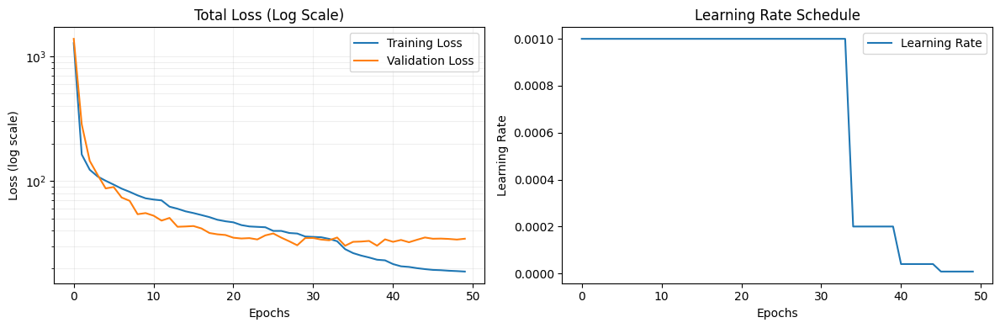

In [30]:
plt.figure(figsize=(12, 4))

# Логарифмический график потерь
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.yscale('log')  # ← Вот это ключевое изменение!
plt.title('Total Loss (Log Scale)')
plt.xlabel('Epochs')
plt.ylabel('Loss (log scale)')
plt.legend()
plt.grid(True, which="both", ls="-", alpha=0.2)  # сетка для логарифмической шкалы

# Learning Rate
plt.subplot(1, 2, 2)
plt.plot(history.history['learning_rate'], label='Learning Rate')
plt.title('Learning Rate Schedule')
plt.xlabel('Epochs')
plt.ylabel('Learning Rate')
plt.legend()

plt.tight_layout()
plt.show()

In [31]:
from PIL import Image, ImageDraw, ImageFont

weights_path_to_load = './yolov3_chess_final_keras.weights.h5'

yolo_inference_model = YoloV3_from_lesson(
    img_size=IMAGE_SIZE,
    current_num_classes=NUM_CLASSES,
    current_anchors_norm=yolo_anchors,
    current_masks=yolo_anchor_masks,
    training_mode=False
)
yolo_inference_model.load_weights(weights_path_to_load)
print(f"Модель для инференса загружена с весами из: {weights_path_to_load}")
yolo_inference_model.compile(jit_compile=False)

Модель для инференса загружена с весами из: ./yolov3_chess_final_keras.weights.h5


In [32]:
!fc-list :lang=ru

/usr/share/fonts/truetype/liberation/LiberationSansNarrow-Italic.ttf: Liberation Sans Narrow:style=Italic
/usr/share/fonts/truetype/liberation/LiberationSans-Regular.ttf: Liberation Sans:style=Regular
/usr/share/fonts/truetype/liberation/LiberationMono-BoldItalic.ttf: Liberation Mono:style=Bold Italic
/usr/share/fonts/truetype/liberation/LiberationSerif-Italic.ttf: Liberation Serif:style=Italic
/usr/share/fonts/truetype/liberation/LiberationMono-Bold.ttf: Liberation Mono:style=Bold
/usr/share/fonts/truetype/liberation/LiberationSansNarrow-Regular.ttf: Liberation Sans Narrow:style=Regular
/usr/share/fonts/truetype/liberation/LiberationSerif-Bold.ttf: Liberation Serif:style=Bold
/usr/share/fonts/truetype/liberation/LiberationMono-Regular.ttf: Liberation Mono:style=Regular
/usr/share/fonts/truetype/liberation/LiberationSans-Italic.ttf: Liberation Sans:style=Italic
/usr/share/fonts/truetype/liberation/LiberationSerif-BoldItalic.ttf: Liberation Serif:style=Bold Italic
/usr/share/fonts/truet

In [33]:
def draw_detections_keras(image_np_rgb, boxes_norm, scores, classes_ids, valid_detections_count, class_names_dict):
    img_h, img_w, _ = image_np_rgb.shape
    pil_img = Image.fromarray(image_np_rgb)
    draw = ImageDraw.Draw(pil_img)
    font_path = "/usr/share/fonts/truetype/liberation/LiberationSans-Regular.ttf"
    font_size = 15
    font = ImageFont.truetype(font_path, font_size)
    for i in range(valid_detections_count):
        if scores[i] < YOLO_SCORE_THRESHOLD_const:
            continue
        class_id = int(classes_ids[i])
        class_name = class_names_dict.get(class_id, f"ID_{class_id}")
        score_val = scores[i]
        x1 = int(boxes_norm[i, 0] * img_w)
        y1 = int(boxes_norm[i, 1] * img_h)
        x2 = int(boxes_norm[i, 2] * img_w)
        y2 = int(boxes_norm[i, 3] * img_h)
        random.seed(class_id)
        color = (random.randint(0,255), random.randint(0,255), random.randint(0,255))
        draw.rectangle([(x1, y1), (x2, y2)], outline=color, width=2)
        label = f"{class_name}: {score_val:.2f}"
        text_bbox = draw.textbbox((x1, y1 - 1), label, font=font)
        text_width = text_bbox[2] - text_bbox[0]
        text_height = text_bbox[3] - text_bbox[1]
        draw.rectangle([(x1, y1 - text_height - 2), (x1 + text_width + 2, y1)], fill=color)
        draw.text((x1 + 1, y1 - text_height - 1), label, fill=(255,255,255), font=font)
    return np.array(pil_img)


Демонстрация на 3 тестовых изображениях:
Обработка: /content/chess_dataset/chess_yolo/valid/images/6a41b6c8201604216ad196f842c6a2c6_jpg.rf.60a06c4ff4af59f4f5f269361528d41d.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
  Время инференса: 4.0055 сек.
  Обнаружено 1 объектов (до фильтрации по порогу в draw_detections_keras).


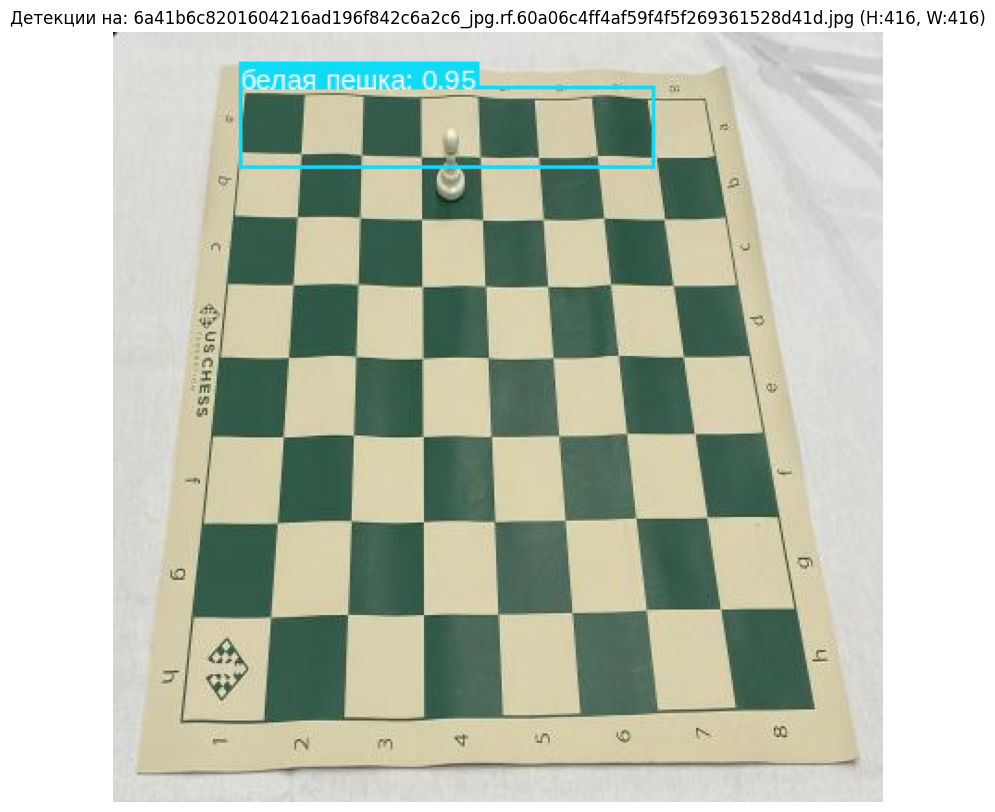

Обработка: /content/chess_dataset/chess_yolo/valid/images/IMG_0311_JPG.rf.60bdeddd1d81863f576805705dee0049.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
  Время инференса: 0.1193 сек.
  Обнаружено 11 объектов (до фильтрации по порогу в draw_detections_keras).


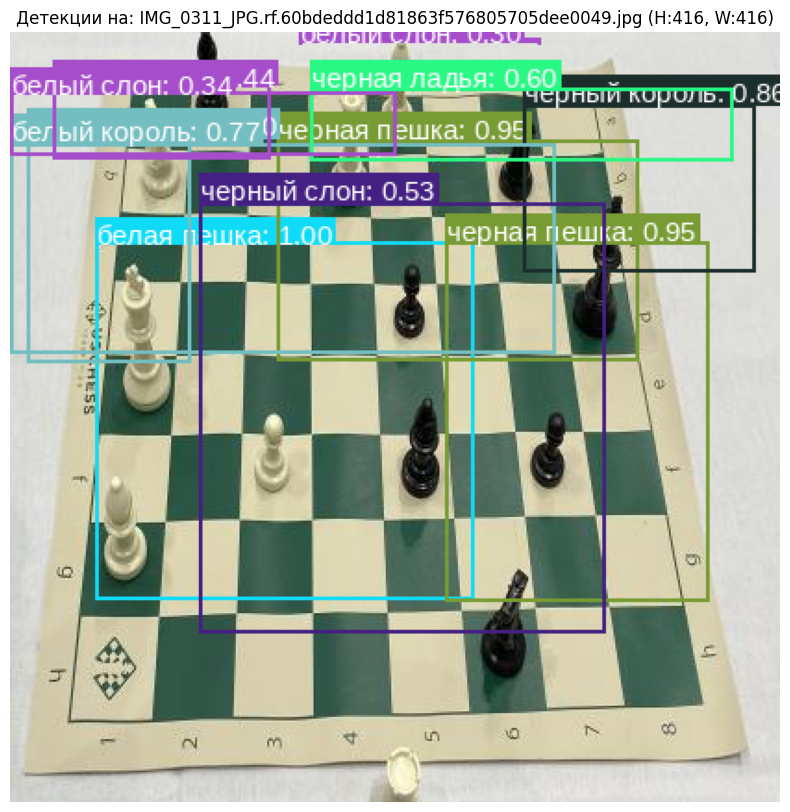

Обработка: /content/chess_dataset/chess_yolo/valid/images/15cc23c777b00d0e123f9df468f2852b_jpg.rf.ec883ea8696547433314cdd8f2c177bf.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
  Время инференса: 0.1178 сек.
  Обнаружено 9 объектов (до фильтрации по порогу в draw_detections_keras).


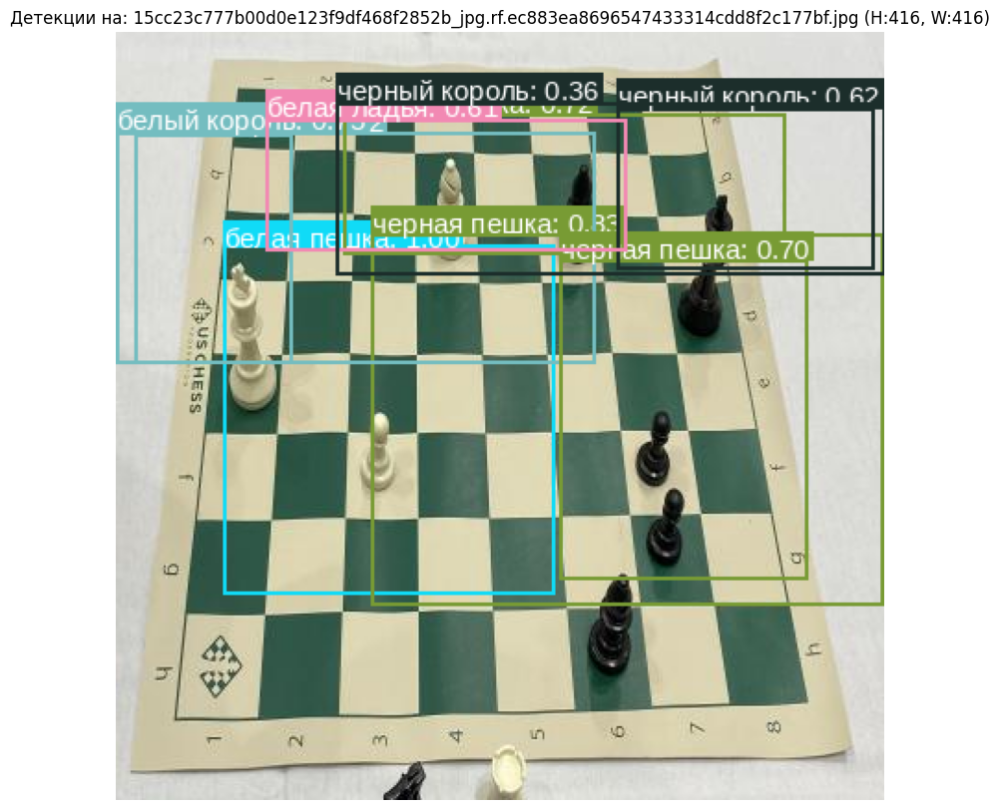

In [34]:
test_image_paths = []
all_val_images = glob.glob(os.path.join(VAL_IMG_DIR, '*.jpg'))
all_val_images.extend(glob.glob(os.path.join(VAL_IMG_DIR, '*.jpeg')))
all_val_images.extend(glob.glob(os.path.join(VAL_IMG_DIR, '*.png')))
num_test_images = min(3, len(all_val_images))
test_image_paths = random.sample(all_val_images, num_test_images)

print(f"\nДемонстрация на {len(test_image_paths)} тестовых изображениях:")
for img_path_test in test_image_paths:
    print(f"Обработка: {img_path_test}")
    original_image_bgr = cv2.imread(img_path_test)
    original_image_rgb = cv2.cvtColor(original_image_bgr, cv2.COLOR_BGR2RGB)
    original_h, original_w, _ = original_image_rgb.shape
    img_for_model_rgb_float = tf.image.convert_image_dtype(original_image_rgb, tf.float32)
    img_resized_tf = tf.image.resize(img_for_model_rgb_float, [IMAGE_SIZE, IMAGE_SIZE])
    img_batch_tf = tf.expand_dims(img_resized_tf, axis=0)
    start_time = time.time()
    pred_boxes, pred_scores, pred_classes, pred_valid_detections = yolo_inference_model.predict(img_batch_tf)
    end_time = time.time()
    print(f"  Время инференса: {end_time - start_time:.4f} сек.")
    boxes_np = pred_boxes[0]
    scores_np = pred_scores[0]
    classes_np = pred_classes[0]
    valid_detections_np = int(pred_valid_detections[0])
    print(f"  Обнаружено {valid_detections_np} объектов (до фильтрации по порогу в draw_detections_keras).")
    img_with_detections = draw_detections_keras(
        original_image_rgb,
        boxes_np,
        scores_np,
        classes_np,
        valid_detections_np,
        CLASS_NAMES
    )
    plt.figure(figsize=(12, 10))
    plt.imshow(img_with_detections)
    plt.title(f"Детекции на: {os.path.basename(img_path_test)} (H:{original_h}, W:{original_w})")
    plt.axis('off')
    plt.show()


In [49]:
!wget -O chess_photo.jpg https://chessbuy.ru/wa-data/public/shop/products/77/19/1977/images/4495/4495.970.jpg

--2025-10-14 15:37:16--  https://chessbuy.ru/wa-data/public/shop/products/77/19/1977/images/4495/4495.970.jpg
Resolving chessbuy.ru (chessbuy.ru)... 89.108.71.106, 2a00:f940:2:4:2::543d
Connecting to chessbuy.ru (chessbuy.ru)|89.108.71.106|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 195725 (191K) [image/jpeg]
Saving to: ‘chess_photo.jpg’

chess_photo.jpg     100%[===================>] 191.14K   567KB/s    in 0.3s    

2025-10-14 15:37:18 (567 KB/s) - ‘chess_photo.jpg’ saved [195725/195725]



Изображение загружено: 970x728
  Время инференса: 0.1162 сек.
  Найдено NMS (valid_detections): 32 объектов.


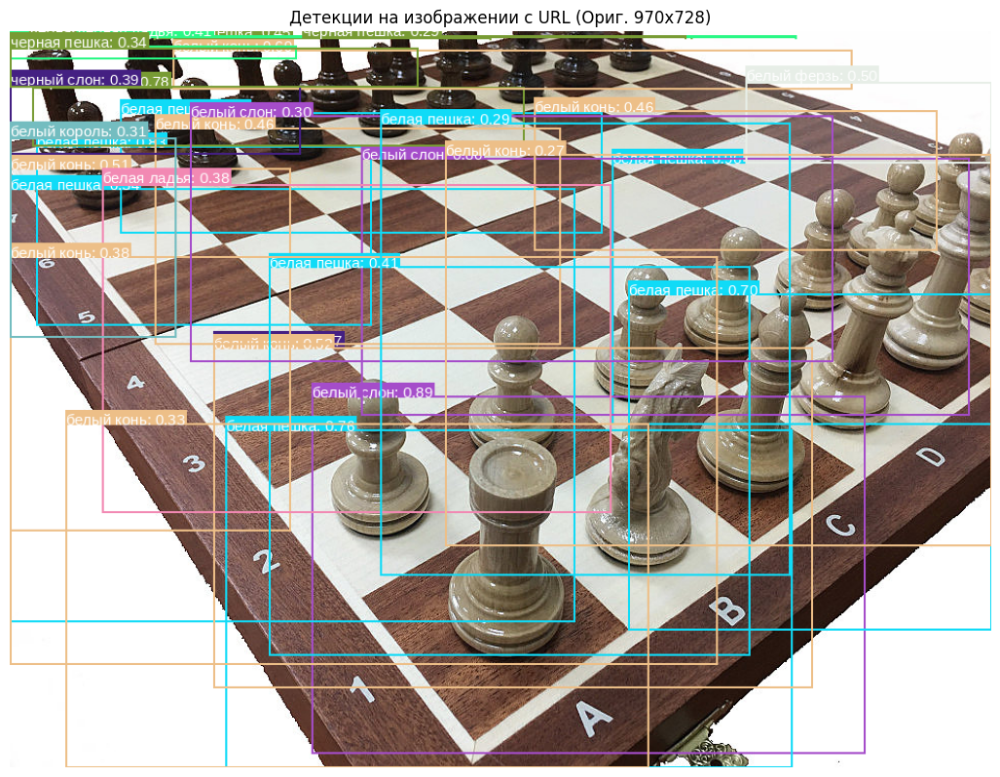

In [50]:
pil_image = Image.open('./chess_photo.jpg').convert('RGB')
original_image_rgb = np.array(pil_image)
if original_image_rgb is None: raise ValueError("Не удалось преобразовать данные в изображение.")
original_h, original_w, _ = original_image_rgb.shape
print(f"Изображение загружено: {original_w}x{original_h}")

img_for_model_rgb_float = tf.image.convert_image_dtype(original_image_rgb, tf.float32)
img_resized_tf = tf.image.resize(img_for_model_rgb_float, [IMAGE_SIZE, IMAGE_SIZE])
img_batch_tf = tf.expand_dims(img_resized_tf, axis=0)

start_time = time.time()
model_outputs = yolo_inference_model.predict(img_batch_tf, verbose=0)
end_time = time.time()

pred_boxes_np, pred_scores_np, pred_classes_np, pred_valid_detections_np = model_outputs[0][0], model_outputs[1][0], model_outputs[2][0], int(model_outputs[3][0])

print(f"  Время инференса: {end_time - start_time:.4f} сек.")
print(f"  Найдено NMS (valid_detections): {pred_valid_detections_np} объектов.")

img_with_detections = draw_detections_keras(
    original_image_rgb, pred_boxes_np, pred_scores_np, pred_classes_np,
    pred_valid_detections_np, CLASS_NAMES
)

plt.figure(figsize=(max(10, original_w // 70), max(8, original_h // 70)))
plt.imshow(img_with_detections)
plt.title(f"Детекции на изображении с URL (Ориг. {original_w}x{original_h})")
plt.axis('off')
plt.show()

# Итог

На нашем датасете модель адекватно научилась распознавать фигуры по классам, хотя сами рамки пока выбираются больше объектов, что связано с добавлением анкоров разных размеров, не представленных в датасете для детекции на изображениях с другими ракурсами, где рамки могут быть больше или меньше.

При обучении заметно, что голова 2 имеет наименьшие потери - как раз эта голова определяла средние объекты, которые и передаются в нашем датасете.

На изображении, взятом из открытого доступа модель смогла определить некоторые фигуры, не смотря на то, что фигуры внешне отличаются от представленных в датасете.

Для доработки качества детекции следует подстроить предел уверенности для классов и рамок.